In [1]:
#We import libraries
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator 
from PIL import Image, ImageEnhance, ImageFilter, ImageDraw
import cv2 as cv
import os
import pandas as pd

In [2]:
#Functions
def plot_accuracy_vs_luxes(luxes, accuracies, title, save_path=None):
    # Convert luxes to numeric
    luxes = pd.to_numeric(luxes, errors="coerce")
    
    # Convert accuracies from percentage strings to decimal numbers
    def convert_accuracy(acc):
        if isinstance(acc, str) and acc.endswith("%"):
            return float(acc.strip("%")) / 100  # Convert percentage to decimal
        return float(acc)  # Return numeric values as-is

    accuracies = pd.Series(accuracies).apply(convert_accuracy)
    
    # Remove rows where either luxes or accuracies is NaN
    valid_indices = ~np.isnan(luxes) & ~np.isnan(accuracies)
    luxes = luxes[valid_indices]
    accuracies = accuracies[valid_indices]
    
    # Plot the cleaned data
    plt.figure(dpi=200)
    plt.scatter(luxes, accuracies, color="blue", alpha=0.7, label="Accuracy")
    plt.title(title)
    plt.xlabel("Luxes")
    plt.ylabel("Accuracy (Decimal)")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()
    plt.tight_layout()

    # Save the plot if save_path is specified
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path)
        print(f"Plot saved to: {save_path}")

    # Display the plot
    plt.show()


def plot_accuracy_vs_luxes_2(luxes, accuracies, title, save_path=None):
    # Convert accuracy strings to floats
    accuracies = [
        float(acc.strip('%')) / 100 if isinstance(acc, str) else acc
        for acc in accuracies
    ]
    
    plt.figure(dpi=200)
    
    # Color-code points based on accuracy ranges
    colors = [
        "red" if acc <= 0.5 else "orange" if acc < 0.9 else "green" 
        for acc in accuracies
    ]
    
    # Scatter plot
    plt.scatter(luxes, accuracies, color=colors, alpha=0.7)
    plt.title(title)
    plt.xlabel("Luxes")
    plt.ylabel("Accuracy")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    
    # Save or show the plot
    if save_path:
        plt.savefig(save_path, format="png")
    else:
        plt.show()
    
    plt.close()

def plot_img_by_dir(img_dir):
    img = Image.open(img_dir)
    img = np.array(img)
    plt.figure(dpi=200)
    plt.axis("off")
    plt.imshow(img)

def mean_mode_std_per_channel(rgb_matrix):
  rgb_matrix = np.array(rgb_matrix)
  mean_array = np.zeros(3)
  mode_array = np.zeros(3)
  std_array = np.zeros(3)
  #Las listas de python van a tener los valores conrrespondientes a los canales RGB
  r_channel = rgb_matrix[:, 0].flatten()
  g_channel = rgb_matrix[:, 1].flatten()
  b_channel = rgb_matrix[:, 2].flatten()
  #Means
  mean_array[0] = np.mean(r_channel)
  mean_array[1] = np.mean(g_channel)
  mean_array[2] = np.mean(b_channel)
  #Mode
  mode_array[0] = np.bincount(r_channel).argmax()
  mode_array[1] = np.bincount(g_channel).argmax()
  mode_array[2] = np.bincount(b_channel).argmax()
  #STD
  std_array[0] = np.std(r_channel)
  std_array[1] = np.std(g_channel)
  std_array[2] = np.std(b_channel)
  return mean_array, mode_array, std_array

def filter_by_sigma(sigma_multiplier, rgb_matrix, mean_array, std_array):
    # Convert RGB matrix to numpy array if not already
    rgb_matrix = np.array(rgb_matrix)
    new_array = []

    # Calculate lower and upper bounds for each channel
    lower_bound = mean_array - sigma_multiplier * std_array
    upper_bound = mean_array + sigma_multiplier * std_array

    # Loop through each pixel and check if each channel is within bounds
    for i in range(len(rgb_matrix)):
        r, g, b = rgb_matrix[i, :]

        # Check if R, G, and B values are within their respective bounds
        if (lower_bound[0] <= r <= upper_bound[0] and
            lower_bound[1] <= g <= upper_bound[1] and
            lower_bound[2] <= b <= upper_bound[2]):
            new_array.append(rgb_matrix[i, :])

    return np.array(new_array)

def list_cameras():
    !v4l2-ctl --list-devices

In [3]:
#Functions
def YOLO_On_Image(imagePath, title, model):
    image = Image.open(imagePath)
    results = model.predict(image)
    centers = []
    for result in results:
        annotator = Annotator(image)
        boxes = result.boxes
        for box in boxes:
            b = box.xyxy[0].numpy()
            c = box.cls
            annotator.box_label(b, model.names[int(c)])
            center_x = int((b[0] + b[2]) / 2)
            center_y = int((b[1] + b[3]) / 2)
            centers.append([center_x, center_y])
    img = annotator.result() 
    plt.figure()
    plt.imshow(img)
    for center in centers:
        plt.scatter(center[0], center[1], s=200, c="r", marker="+")
    plt.axis("off")
    plt.title(title)
    print(centers)
    return centers

def pytorch_to_tflite_model(pytorch_model_path):
    model = YOLO(pytorch_model_path)
    model.export(format="tflite")

def clean_and_filter_db(df, valid_class):
    # Replace NaN or incorrect classes with zero accuracy
    df["Accuracy"] = df.apply(
        lambda row: 0.0 if pd.isna(row["Predicted Class"]) or valid_class not in row["Predicted Class"] else row["Accuracy"],
        axis=1,
    )
    return df

def divide_db_into_categories(db_path, NO_IR_Path, Normal_Path):
    db = pd.read_csv(db_path)
    #Primera división en NO_IR y Normal DBs
    NO_IR_DB = db[db["Image Name"].str.contains("NO_IR", case=False)]
    NORMAL_DB = db[db["Image Name"].str.contains("Normal", case=False)]

    #Subdivisión 2
    #Normal
    Normal_airbuds = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Airbuds", case=False)]
    Normal_arduino = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Arduino", case=False)]
    Normal_fork = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Fork", case=False)]
    Normal_lego = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Lego", case=False)]
    Normal_marker = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Marker", case=False)]
    Normal_pen = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Pen", case=False)]
    Normal_proto = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Protoboard", case=False)]

    #NO IR
    NO_IR_airbuds = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Airbuds", case=False)]
    NO_IR_arduino = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Arduino", case=False)]
    NO_IR_fork = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Fork", case=False)]
    NO_IR_lego = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Lego", case=False)]
    NO_IR_marker = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Marker", case=False)]
    NO_IR_pen = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Pen", case=False)]
    NO_IR_proto = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Protoboard", case=False)]

    #Filtramos
    NO_IR_airbuds = clean_and_filter_db(NO_IR_airbuds, "earbuds")
    NO_IR_arduino = clean_and_filter_db(NO_IR_arduino, "arduino")
    NO_IR_fork = clean_and_filter_db(NO_IR_fork, "fork")
    NO_IR_lego = clean_and_filter_db(NO_IR_lego, "lego figure")
    NO_IR_marker = clean_and_filter_db(NO_IR_marker, "marker")
    NO_IR_pen = clean_and_filter_db(NO_IR_pen, "pen")
    NO_IR_proto = clean_and_filter_db(NO_IR_proto, "protoboard")

    # Normal databases
    Normal_airbuds = clean_and_filter_db(Normal_airbuds, "earbuds")
    Normal_arduino = clean_and_filter_db(Normal_arduino, "arduino")
    Normal_fork = clean_and_filter_db(Normal_fork, "fork")
    Normal_lego = clean_and_filter_db(Normal_lego, "lego figure")
    Normal_marker = clean_and_filter_db(Normal_marker, "marker")
    Normal_pen = clean_and_filter_db(Normal_pen, "pen")
    Normal_proto = clean_and_filter_db(Normal_proto, "protoboard")

    #Ahora las guardamos
    #NO_IR
    NO_IR_airbuds.to_csv(os.path.join(NO_IR_Path, "NO_IR_airbuds_filtered.csv"), index=False)
    NO_IR_arduino.to_csv(os.path.join(NO_IR_Path, "NO_IR_arduino_filtered.csv"), index=False)
    NO_IR_fork.to_csv(os.path.join(NO_IR_Path, "NO_IR_fork_filtered.csv"), index=False)
    NO_IR_lego.to_csv(os.path.join(NO_IR_Path, "NO_IR_lego_filtered.csv"), index=False)
    NO_IR_marker.to_csv(os.path.join(NO_IR_Path, "NO_IR_marker_filtered.csv"), index=False)
    NO_IR_pen.to_csv(os.path.join(NO_IR_Path, "NO_IR_pen_filtered.csv"), index=False)
    NO_IR_proto.to_csv(os.path.join(NO_IR_Path, "NO_IR_proto_filtered.csv"), index=False)

    #Normal
    Normal_airbuds.to_csv(os.path.join(Normal_Path, "normal_airbuds_filtered.csv"), index=False)
    Normal_arduino.to_csv(os.path.join(Normal_Path, "normal_arduino_filtered.csv"), index=False)
    Normal_fork.to_csv(os.path.join(Normal_Path, "normal_fork_filtered.csv"), index=False)
    Normal_lego.to_csv(os.path.join(Normal_Path, "normal_lego_filtered.csv"), index=False)
    Normal_marker.to_csv(os.path.join(Normal_Path, "normal_marker_filtered.csv"), index=False)
    Normal_pen.to_csv(os.path.join(Normal_Path, "normal_pen_filtered.csv"), index=False)
    Normal_proto.to_csv(os.path.join(Normal_Path, "normal_proto_filtered.csv"), index=False)

def plot_img_by_array(img_array):
    plt.figure(dpi = 200)
    plt.imshow(img_array)
    plt.axis("off")

    
def save_pick(number_of_images, main_savepath, cam_index):
    # Ensure save directory exists
    if not os.path.exists(main_savepath):
        os.makedirs(main_savepath)
    cam = cv.VideoCapture(cam_index)
    if not cam.isOpened():
        print("Error: Camera not accessible!")
        return
    print("Press 'c' to capture an image, or 'q' to quit.")
    captured_count = 0
    while captured_count < number_of_images:
        ret, frame = cam.read()
        if not ret:
            print("Failed to grab frame. Exiting...")
            break
        cv.imshow("Camera Feed", frame)
        key = cv.waitKey(1) & 0xFF
        if key == ord('q'):  # Quit on 'q' key
            break
        elif key == ord('c'):  # Capture image on 'c' key
            img_name = f"img_{captured_count + 1}.jpg"
            full_img_path = os.path.join(main_savepath, img_name)
            cv.imwrite(full_img_path, frame)
            print(f"Saved: {full_img_path}")
            captured_count += 1
    cam.release()
    cv.destroyAllWindows()


In [11]:
# Load the YOLO model
model = YOLO("models/best_yolo_2/best_model_2_saved_model/best_model_2_float16.tflite")

# Lists to store image names, accuracies, and predicted classes
img_names = []
accuracies = []
predicted_classes = []

# Main folder containing images
main_folder = "new_images"
subfolders_1 = os.listdir(main_folder)

# Loop through subfolders and images
for i in range(len(subfolders_1)):
    main_folder_1 = os.path.join(main_folder, subfolders_1[i])
    subfolders_2 = os.listdir(main_folder_1)
    for j in range(len(subfolders_2)):
        main_folder_2 = os.path.join(main_folder_1, subfolders_2[j])
        images = os.listdir(main_folder_2)
        images = sorted(images, key=lambda x: int(''.join(filter(str.isdigit, x))))
        for k in range(len(images)):
            # Load and preprocess the image
            final_img_path = os.path.join(main_folder_2, images[k])
            final_img = cv.imread(final_img_path)
            img_names.append(final_img_path)  # Append the image name

            # Run prediction
            results = model.predict(final_img)

            # Initialize Annotator
            annotator = Annotator(final_img)
            total_confidence = 0.0
            object_count = 0
            classes_in_image = []  # To store classes detected in this image

            for result in results:
                boxes = result.boxes
                for box in boxes:
                    b = box.xyxy[0].numpy()
                    c = box.cls
                    confidence = box.conf[0].numpy()  # Confidence score of the detected object
                    total_confidence += confidence
                    object_count += 1
                    classes_in_image.append(model.names[int(c)])  # Save the class name

                    # Annotate the frame with box and label
                    annotator.box_label(b, f"{model.names[int(c)]} {confidence:.2f}")

            # Calculate the accuracy (average confidence score)
            accuracy = total_confidence / object_count if object_count > 0 else 0.0
            accuracies.append(accuracy)
            predicted_classes.append(classes_in_image)  # Append classes for this image

            # Display the annotated frame with accuracy
            processed_frame = annotator.result()
            cv.putText(
                processed_frame,
                f"Accuracy: {accuracy:.2%}",
                (10, 30),
                cv.FONT_HERSHEY_SIMPLEX,
                0.7,
                (0, 0, 255),
                2,
                cv.LINE_AA,
            )

            # Show the frame
            cv.imshow("Processed Frame", processed_frame)
            if cv.waitKey(1) & 0xFF == ord('q'):
                break

# Release OpenCV resources
cv.destroyAllWindows()

#Vemos que el proceso haya terminado
print("Done predicting")

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading models/best_yolo_2/best_model_2_saved_model/best_model_2_float16.tflite for TensorFlow Lite inference...

0: 640x640 1 arduino, 546.8ms
Speed: 29.3ms preprocess, 546.8ms inference, 17.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 arduino, 783.0ms
Speed: 26.5ms preprocess, 783.0ms inference, 20.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 arduino, 554.2ms
Speed: 17.1ms preprocess, 554.2ms inference, 14.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 arduino, 491.8ms
Speed: 13.5ms preprocess, 491.8ms inference, 14.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 arduino, 589.3ms
Speed: 7.6ms preprocess, 589.3ms inference, 15.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 arduino, 1 esp32, 475.5ms
Speed: 16.5ms prep

In [22]:
db = pd.read_csv("predictions.csv")
db.head()

,Image Name,Accuracy,Predicted Classes
0,new_images/NORMAL/protoboard/protoboard_1.jpg,66.57%,arduino
1,new_images/NORMAL/protoboard/protoboard_2.jpg,85.54%,arduino
2,new_images/NORMAL/protoboard/protoboard_3.jpg,56.44%,arduino
3,new_images/NORMAL/protoboard/protoboard_4.jpg,66.23%,arduino
4,new_images/NORMAL/protoboard/protoboard_5.jpg,62.57%,arduino


In [25]:
#Vamos a dividir la data primero en los folders de Normal y NO_IR
NORMAL_DB = db[db["Image Name"].str.contains("NORMAL", case=False)]
NO_IR_DB = db[db["Image Name"].str.contains("NO_IR", case=False)]

In [26]:
#Vemos las bases
NORMAL_DB.head()

,Image Name,Accuracy,Predicted Classes
0,new_images/NORMAL/protoboard/protoboard_1.jpg,66.57%,arduino
1,new_images/NORMAL/protoboard/protoboard_2.jpg,85.54%,arduino
2,new_images/NORMAL/protoboard/protoboard_3.jpg,56.44%,arduino
3,new_images/NORMAL/protoboard/protoboard_4.jpg,66.23%,arduino
4,new_images/NORMAL/protoboard/protoboard_5.jpg,62.57%,arduino


In [27]:
#Vemos las bases
NO_IR_DB.head()

,Image Name,Accuracy,Predicted Classes
329,new_images/NO_IR/protoboard/protoboard_1.jpg,72.79%,"protoboard, esp32"
330,new_images/NO_IR/protoboard/protoboard_2.jpg,91.60%,"protoboard, esp32"
331,new_images/NO_IR/protoboard/protoboard_3.jpg,92.74%,"protoboard, esp32"
332,new_images/NO_IR/protoboard/protoboard_4.jpg,93.20%,"protoboard, esp32"
333,new_images/NO_IR/protoboard/protoboard_5.jpg,95.83%,"protoboard, esp32"


In [37]:
#Vamos ahora con todos los items
#Normal
normal_airbuds = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Airbuds", case=False)]
normal_arduino = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Arduino", case=False)]
normal_fork = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Fork", case=False)]
normal_lego = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Lego", case=False)]
normal_marker = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Marker", case=False)]
normal_pen = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Pen", case=False)]
normal_proto = NORMAL_DB[NORMAL_DB["Image Name"].str.contains("Protoboard", case=False)]

#NO IR
NO_IR_airbuds = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Airbuds", case=False)]
NO_IR_arduino = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Arduino", case=False)]
NO_IR_fork = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Fork", case=False)]
NO_IR_lego = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Lego", case=False)]
NO_IR_marker = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Marker", case=False)]
NO_IR_pen = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Pen", case=False)]
NO_IR_proto = NO_IR_DB[NO_IR_DB["Image Name"].str.contains("Protoboard", case=False)]

In [38]:
#Vamos a filtrar las que también tienen su clase correspondiente a la imagen
normal_db = [normal_airbuds, normal_arduino, normal_fork, normal_lego, normal_marker, normal_pen, normal_proto]
no_ir_db = [NO_IR_airbuds, NO_IR_arduino, NO_IR_fork, NO_IR_lego, NO_IR_marker, NO_IR_pen, NO_IR_proto]

#Cámara normal
for i in range(len(normal_db)):
    print(f"Length: {normal_db[i].shape[0]}")

#Cámara NO IR
for i in range(len(no_ir_db)):
    print(f"Length: {no_ir_db[i].shape[0]}")

#Vemos que todas tienen 47 elementos

Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47
Length: 47


In [39]:
Luxes = np.load("Luxes_array.npy")

In [41]:
#Añadimos los luxes a las bases
for db in normal_db + no_ir_db:
    db["Luxes"] = Luxes

/tmp/ipykernel_14864/2169885205.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["Luxes"] = Luxes
/tmp/ipykernel_14864/2169885205.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["Luxes"] = Luxes
/tmp/ipykernel_14864/2169885205.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning

In [48]:
#Vemos algunos ejemplos
normal_airbuds.head(5)

,Image Name,Accuracy,Predicted Classes,Luxes
47,new_images/NORMAL/airbuds/airbuds_1.jpg,94.00%,earbuds,1613.0
48,new_images/NORMAL/airbuds/airbuds_2.jpg,86.84%,earbuds,1558.0
49,new_images/NORMAL/airbuds/airbuds_3.jpg,92.58%,earbuds,1503.0
50,new_images/NORMAL/airbuds/airbuds_4.jpg,92.84%,earbuds,1448.0
51,new_images/NORMAL/airbuds/airbuds_5.jpg,91.08%,earbuds,1393.0


In [ ]:
#Ahora, vamos a guardar todas las bases como archivos csv
normal_db = [normal_airbuds, normal_arduino, normal_fork, normal_lego, normal_marker, normal_pen, normal_proto]
no_ir_db = [NO_IR_airbuds, NO_IR_arduino, NO_IR_fork, NO_IR_lego, NO_IR_marker, NO_IR_pen, NO_IR_proto]

#Normal folder
No_IR_Folder = "Databases_with_accuracy/No_IR"
Normal_Folder = "Databases_with_accuracy/Normal"

for db, var_name in zip(normal_db + no_ir_db, ['normal_airbuds', 'normal_arduino', 'normal_fork', 'normal_lego', 'normal_marker', 'normal_pen', 'normal_proto', 'NO_IR_airbuds', 'NO_IR_arduino', 'NO_IR_fork', 'NO_IR_lego', 'NO_IR_marker', 'NO_IR_pen', 'NO_IR_proto']):
    db.to_csv(f"{var_name}.csv", index=False)

In [53]:
#Ahora vamos a remplazar las categorías mal obtenidas o incorrectas con un cero en accuracy
#Esto lo hacemos para cada base de datos ya que cada una representa el accuracy utilizando una cámara y prediciendo un objeto en específico
#Vamos primero con la parte de NO_IR
NO_IR_airbuds = pd.read_csv("Databases_with_accuracy/No_IR/NO_IR_airbuds.csv")
NO_IR_arduino = pd.read_csv("Databases_with_accuracy/No_IR/NO_IR_arduino.csv")
NO_IR_fork = pd.read_csv("Databases_with_accuracy/No_IR/NO_IR_fork.csv")
NO_IR_lego = pd.read_csv("Databases_with_accuracy/No_IR/NO_IR_lego.csv")
NO_IR_marker = pd.read_csv("Databases_with_accuracy/No_IR/NO_IR_marker.csv")
NO_IR_pen = pd.read_csv("Databases_with_accuracy/No_IR/NO_IR_pen.csv")
NO_IR_proto = pd.read_csv("Databases_with_accuracy/No_IR/NO_IR_proto.csv")

#Completamos con la parte de Normal
Normal_airbuds = pd.read_csv("Databases_with_accuracy/Normal/normal_airbuds.csv")
Normal_arduino = pd.read_csv("Databases_with_accuracy/Normal/normal_arduino.csv")
Normal_fork = pd.read_csv("Databases_with_accuracy/Normal/normal_fork.csv")
Normal_lego = pd.read_csv("Databases_with_accuracy/Normal/normal_lego.csv")
Normal_marker = pd.read_csv("Databases_with_accuracy/Normal/normal_marker.csv")
Normal_pen = pd.read_csv("Databases_with_accuracy/Normal/normal_pen.csv")
Normal_proto = pd.read_csv("Databases_with_accuracy/Normal/normal_proto.csv")

NO_IR_lego.head()

,Image Name,Accuracy,Predicted Classes,Luxes
0,new_images/NO_IR/lego/lego_1.jpg,91.60%,lego figure,1613.0
1,new_images/NO_IR/lego/lego_2.jpg,87.57%,lego figure,1558.0
2,new_images/NO_IR/lego/lego_3.jpg,71.31%,lego figure,1503.0
3,new_images/NO_IR/lego/lego_4.jpg,0.00%,NaN,1448.0
4,new_images/NO_IR/lego/lego_5.jpg,66.81%,lego figure,1393.0


In [54]:
#Vamos a filtrar 
NO_IR_airbuds = clean_and_filter_db(NO_IR_airbuds, "earbuds")
NO_IR_arduino = clean_and_filter_db(NO_IR_arduino, "arduino")
NO_IR_fork = clean_and_filter_db(NO_IR_fork, "fork")
NO_IR_lego = clean_and_filter_db(NO_IR_lego, "lego figure")
NO_IR_marker = clean_and_filter_db(NO_IR_marker, "marker")
NO_IR_pen = clean_and_filter_db(NO_IR_pen, "pen")
NO_IR_proto = clean_and_filter_db(NO_IR_proto, "protoboard")

# Normal databases
Normal_airbuds = clean_and_filter_db(Normal_airbuds, "earbuds")
Normal_arduino = clean_and_filter_db(Normal_arduino, "arduino")
Normal_fork = clean_and_filter_db(Normal_fork, "fork")
Normal_lego = clean_and_filter_db(Normal_lego, "lego figure")
Normal_marker = clean_and_filter_db(Normal_marker, "marker")
Normal_pen = clean_and_filter_db(Normal_pen, "pen")
Normal_proto = clean_and_filter_db(Normal_proto, "protoboard")

print("Done filtering")

Done filtering


In [55]:
NO_IR_Path = "Filtered_DBs/NO_IR"
Normal_Path = "Filtered_DBs/Normal"

#Guardamos las bases filtradas
#NO_IR
NO_IR_airbuds.to_csv(os.path.join(NO_IR_Path, "NO_IR_airbuds_filtered.csv"), index=False)
NO_IR_arduino.to_csv(os.path.join(NO_IR_Path, "NO_IR_arduino_filtered.csv"), index=False)
NO_IR_fork.to_csv(os.path.join(NO_IR_Path, "NO_IR_fork_filtered.csv"), index=False)
NO_IR_lego.to_csv(os.path.join(NO_IR_Path, "NO_IR_lego_filtered.csv"), index=False)
NO_IR_marker.to_csv(os.path.join(NO_IR_Path, "NO_IR_marker_filtered.csv"), index=False)
NO_IR_pen.to_csv(os.path.join(NO_IR_Path, "NO_IR_pen_filtered.csv"), index=False)
NO_IR_proto.to_csv(os.path.join(NO_IR_Path, "NO_IR_proto_filtered.csv"), index=False)

#Normal
Normal_airbuds.to_csv(os.path.join(Normal_Path, "normal_airbuds_filtered.csv"), index=False)
Normal_arduino.to_csv(os.path.join(Normal_Path, "normal_arduino_filtered.csv"), index=False)
Normal_fork.to_csv(os.path.join(Normal_Path, "normal_fork_filtered.csv"), index=False)
Normal_lego.to_csv(os.path.join(Normal_Path, "normal_lego_filtered.csv"), index=False)
Normal_marker.to_csv(os.path.join(Normal_Path, "normal_marker_filtered.csv"), index=False)
Normal_pen.to_csv(os.path.join(Normal_Path, "normal_pen_filtered.csv"), index=False)
Normal_proto.to_csv(os.path.join(Normal_Path, "normal_proto_filtered.csv"), index=False)

In [56]:
#Ahora vamos a extraer los luxes y accuracy para cada categoría por cámara
#Vemos un ejemplo
Normal_airbuds.head()

,Image Name,Accuracy,Predicted Classes,Luxes
0,new_images/NORMAL/airbuds/airbuds_1.jpg,94.00%,earbuds,1613.0
1,new_images/NORMAL/airbuds/airbuds_2.jpg,86.84%,earbuds,1558.0
2,new_images/NORMAL/airbuds/airbuds_3.jpg,92.58%,earbuds,1503.0
3,new_images/NORMAL/airbuds/airbuds_4.jpg,92.84%,earbuds,1448.0
4,new_images/NORMAL/airbuds/airbuds_5.jpg,91.08%,earbuds,1393.0


In [12]:
#Cargamos las bases de datos
#Empezamos por la normal
Normal_airbuds = pd.read_csv("Filtered_DBs/Normal/normal_airbuds_filtered.csv")
Normal_arduino = pd.read_csv("Filtered_DBs/Normal/normal_arduino_filtered.csv")
Normal_fork = pd.read_csv("Filtered_DBs/Normal/normal_fork_filtered.csv")
Normal_lego = pd.read_csv("Filtered_DBs/Normal/normal_lego_filtered.csv")
Normal_marker = pd.read_csv("Filtered_DBs/Normal/normal_marker_filtered.csv")
Normal_pen = pd.read_csv("Filtered_DBs/Normal/normal_pen_filtered.csv")
Normal_proto = pd.read_csv("Filtered_DBs/Normal/normal_proto_filtered.csv")

#Ahora vamos por NO_IR
NO_IR_airbuds = pd.read_csv("Filtered_DBs/NO_IR/NO_IR_airbuds_filtered.csv")
NO_IR_arduino = pd.read_csv("Filtered_DBs/NO_IR/NO_IR_arduino_filtered.csv")
NO_IR_fork = pd.read_csv("Filtered_DBs/NO_IR/NO_IR_fork_filtered.csv")
NO_IR_lego = pd.read_csv("Filtered_DBs/NO_IR/NO_IR_lego_filtered.csv")
NO_IR_marker = pd.read_csv("Filtered_DBs/NO_IR/NO_IR_marker_filtered.csv")
NO_IR_pen = pd.read_csv("Filtered_DBs/NO_IR/NO_IR_pen_filtered.csv")
NO_IR_proto = pd.read_csv("Filtered_DBs/NO_IR/NO_IR_proto_filtered.csv")

In [13]:
Normal_Camera = [Normal_airbuds, Normal_arduino, Normal_fork, Normal_lego, Normal_marker, Normal_pen, Normal_proto]

NO_IR_Camera = [NO_IR_airbuds, NO_IR_arduino, NO_IR_fork, NO_IR_lego, NO_IR_marker, NO_IR_pen, NO_IR_proto]

# Extract Accuracy and Lux values for Normal camera datasets
Normal_Camera_airbuds_accuracy = np.array(Normal_airbuds["Accuracy"])
Normal_Camera_airbuds_luxes = np.array(Normal_airbuds["Luxes"])

Normal_Camera_arduino_accuracy = np.array(Normal_arduino["Accuracy"])
Normal_Camera_arduino_luxes = np.array(Normal_arduino["Luxes"])

Normal_Camera_fork_accuracy = np.array(Normal_fork["Accuracy"])
Normal_Camera_fork_luxes = np.array(Normal_fork["Luxes"])

Normal_Camera_lego_accuracy = np.array(Normal_lego["Accuracy"])
Normal_Camera_lego_luxes = np.array(Normal_lego["Luxes"])

Normal_Camera_marker_accuracy = np.array(Normal_marker["Accuracy"])
Normal_Camera_marker_luxes = np.array(Normal_marker["Luxes"])

Normal_Camera_pen_accuracy = np.array(Normal_pen["Accuracy"])
Normal_Camera_pen_luxes = np.array(Normal_pen["Luxes"])

Normal_Camera_proto_accuracy = np.array(Normal_proto["Accuracy"])
Normal_Camera_proto_luxes = np.array(Normal_proto["Luxes"])

# Extract Accuracy and Lux values for NO_IR datasets
NO_IR_Camera_airbuds_accuracy = np.array(NO_IR_airbuds["Accuracy"])
NO_IR_Camera_airbuds_luxes = np.array(NO_IR_airbuds["Luxes"])

NO_IR_Camera_arduino_accuracy = np.array(NO_IR_arduino["Accuracy"])
NO_IR_Camera_arduino_luxes = np.array(NO_IR_arduino["Luxes"])

NO_IR_Camera_fork_accuracy = np.array(NO_IR_fork["Accuracy"])
NO_IR_Camera_fork_luxes = np.array(NO_IR_fork["Luxes"])

NO_IR_Camera_lego_accuracy = np.array(NO_IR_lego["Accuracy"])
NO_IR_Camera_lego_luxes = np.array(NO_IR_lego["Luxes"])

NO_IR_Camera_marker_accuracy = np.array(NO_IR_marker["Accuracy"])
NO_IR_Camera_marker_luxes = np.array(NO_IR_marker["Luxes"])

NO_IR_Camera_pen_accuracy = np.array(NO_IR_pen["Accuracy"])
NO_IR_Camera_pen_luxes = np.array(NO_IR_pen["Luxes"])

NO_IR_Camera_proto_accuracy = np.array(NO_IR_proto["Accuracy"])
NO_IR_Camera_proto_luxes = np.array(NO_IR_proto["Luxes"])

In [ ]:
#Parámetros
#Enfoque
#Luxes
#Forma (Simple o compleja)
#Colores (Blanco y negro) (Colores complementarios)
#Distancia

#Graficar por color
#Menor 50 - Rojo
#50 -90 Naranja
#90 - Verde

#Infrarojo 

In [ ]:
#Vamos a aumentar el dataset de aquellos elementos cuyas predicciones fueron las peores
#Los objetos con menor accuracy son los siguientes

#NO_IR
#Fork
#Arduino
#Pen
#Airbuds
#Marker

#Normal
#Marker
#Protoboard
#Pen
#Fork

Vamos a hacer lo siguiente:
1. Reentrenar el modelo
2. Probar el modelo
3. Obtener las imágenes, categorías y accuracy
4. Obtener desviación estándar de las imágenes completas
5. Obtener la desviación estándar por color solo en el objeto
6. Evaluate the complexity of the contours of the images in the box

In [6]:
#Pasamos el modelo a tensorflow_lite
pytorch_to_tflite_model("models/best_yolo_5/best_model_5.pt")

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.1+cu124 CPU (AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx)
Model summary (fused): 168 layers, 3,010,133 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'models/best_yolo_5/best_model_5.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 27, 8400) (5.9 MB)


E0000 00:00:1732573871.688276    6496 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1732573871.717889    6496 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



TensorFlow SavedModel: starting export with tensorflow 2.18.0...

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.36...
ONNX: export success ✅ 2.0s, saved as 'models/best_yolo_5/best_model_5.onnx' (11.8 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...


I0000 00:00:1732573886.841606    6496 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
I0000 00:00:1732573886.841754    6496 single_machine.cc:361] Starting new session
W0000 00:00:1732573887.890643    6496 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1732573887.890684    6496 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1732573889.044351    6496 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
I0000 00:00:1732573889.044475    6496 single_machine.cc:361] Starting new session
W0000 00:00:1732573889.864132    6496 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1732573889.864156    6496 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.


TensorFlow SavedModel: export success ✅ 21.7s, saved as 'models/best_yolo_5/best_model_5_saved_model' (29.5 MB)

TensorFlow Lite: starting export with tensorflow 2.18.0...
TensorFlow Lite: export success ✅ 0.0s, saved as 'models/best_yolo_5/best_model_5_saved_model/best_model_5_float32.tflite' (11.7 MB)

Export complete (22.6s)
Results saved to /home/jesus/Documents/Servicio_Social/models/best_yolo_5
Predict:         yolo predict task=detect model=models/best_yolo_5/best_model_5_saved_model/best_model_5_float32.tflite imgsz=640  
Validate:        yolo val task=detect model=models/best_yolo_5/best_model_5_saved_model/best_model_5_float32.tflite imgsz=640 data=/content/drive/MyDrive/train_yolo_models/conditioned_db/training.yaml  
Visualize:       https://netron.app


In [7]:
# Load the YOLO model
model = YOLO("models/best_yolo_5/best_model_5_saved_model/best_model_5_float16.tflite")

#Guardamos datos
# Initialize arrays to store data
img_names = []
accuracies = []  # Store the highest confidence for each image
predicted_classes = []  # Store only the category with the highest confidence for each image

# Main folder containing images
main_folder = "new_images"
subfolders_1 = os.listdir(main_folder)

# Loop through subfolders and images
for i in range(len(subfolders_1)):
    main_folder_1 = os.path.join(main_folder, subfolders_1[i])
    subfolders_2 = os.listdir(main_folder_1)
    for j in range(len(subfolders_2)):
        main_folder_2 = os.path.join(main_folder_1, subfolders_2[j])
        images = os.listdir(main_folder_2)
        images = sorted(images, key=lambda x: int(''.join(filter(str.isdigit, x))))
        for k in range(len(images)):
            # Load and preprocess the image
            final_img_path = os.path.join(main_folder_2, images[k])
            final_img = cv.imread(final_img_path)
            img_names.append(final_img_path)  # Append the image name

            # Run prediction
            results = model.predict(final_img)

            # Initialize Annotator
            annotator = Annotator(final_img)
            max_confidence = 0.0  # Track the highest confidence for this image
            best_class = None  # Track the category with the highest confidence

            for result in results:
                boxes = result.boxes
                for box in boxes:
                    b = box.xyxy[0].numpy()
                    c = box.cls
                    confidence = box.conf[0].numpy()  # Confidence score of the detected object
                    
                    # Update max confidence and best class
                    if confidence > max_confidence:
                        max_confidence = confidence
                        best_class = model.names[int(c)]

                    # Annotate the frame with box and label
                    annotator.box_label(b, f"{model.names[int(c)]} {confidence:.2f}")

            # Append the highest confidence and corresponding class
            accuracies.append(max_confidence)
            predicted_classes.append(best_class if best_class else "None")

            # Display the annotated frame with the max confidence and class
            processed_frame = annotator.result()
            if best_class:
                cv.putText(
                    processed_frame,
                    f"Best: {best_class} ({max_confidence:.2%})",
                    (10, 30),
                    cv.FONT_HERSHEY_SIMPLEX,
                    0.7,
                    (0, 0, 255),
                    2,
                    cv.LINE_AA,
                )

            # Show the frame
            cv.imshow("Processed Frame", processed_frame)
            if cv.waitKey(1) & 0xFF == ord('q'):
                break

# Release OpenCV resources
cv.destroyAllWindows()
print("Done predicting")

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading models/best_yolo_5/best_model_5_saved_model/best_model_5_float16.tflite for TensorFlow Lite inference...



INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


0: 640x640 1 protoboard, 1 esp32, 266.0ms
Speed: 6.7ms preprocess, 266.0ms inference, 8.2ms postprocess per image at shape (1, 3, 640, 640)



qt.qpa.plugin: Could not find the Qt platform plugin "wayland" in "/home/jesus/Documents/Servicio_Social/servicio_social_venv/lib/python3.10/site-packages/cv2/qt/plugins"


0: 640x640 1 protoboard, 1 esp32, 299.9ms
Speed: 2.4ms preprocess, 299.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 295.6ms
Speed: 3.6ms preprocess, 295.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 280.3ms
Speed: 6.5ms preprocess, 280.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 245.2ms
Speed: 6.4ms preprocess, 245.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 240.5ms
Speed: 2.3ms preprocess, 240.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 239.9ms
Speed: 6.0ms preprocess, 239.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 250.8ms
Speed: 2.1ms preprocess, 250.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 

In [8]:
#Cargamos el array
luxes_array = np.load("Luxes_array.npy")
print((len(img_names))/(len(luxes_array)))
#Vamos a concatenar el arreglo de Luxes 14 veces
all_luxes = np.concatenate([luxes_array]*14)
print(len(all_luxes))
print(len(img_names))

14.0
658
658


In [9]:
#Vamos a poner los arreglos como un dataframe
data = {
    "Image Name": img_names,
    "Accuracy": accuracies,
    "Predicted Class": predicted_classes,
    "Luxes": all_luxes
}
df = pd.DataFrame(data)

csv_filename = "predictions_2.csv"
df.to_csv(csv_filename, index=False)

In [10]:
#Vemos la base de datos
df_2 = pd.read_csv("predictions_2.csv")
df_2.head(10)

,Image Name,Accuracy,Predicted Class,Luxes
0,new_images/NORMAL/protoboard/protoboard_1.jpg,0.959771,protoboard,1613.0
1,new_images/NORMAL/protoboard/protoboard_2.jpg,0.981685,protoboard,1558.0
2,new_images/NORMAL/protoboard/protoboard_3.jpg,0.970869,protoboard,1503.0
3,new_images/NORMAL/protoboard/protoboard_4.jpg,0.961301,protoboard,1448.0
4,new_images/NORMAL/protoboard/protoboard_5.jpg,0.962341,protoboard,1393.0
5,new_images/NORMAL/protoboard/protoboard_6.jpg,0.949581,protoboard,1338.0
6,new_images/NORMAL/protoboard/protoboard_7.jpg,0.965683,protoboard,1283.0
7,new_images/NORMAL/protoboard/protoboard_8.jpg,0.971249,protoboard,1226.0
8,new_images/NORMAL/protoboard/protoboard_9.jpg,0.962225,protoboard,1171.0
9,new_images/NORMAL/protoboard/protoboard_10.jpg,0.980470,protoboard,1108.0


In [11]:
#Cargamos la base de datos
db_2 = pd.read_csv("predictions_2.csv")
#Le damos un vistazo a los datos
db_2.head()

,Image Name,Accuracy,Predicted Class,Luxes
0,new_images/NORMAL/protoboard/protoboard_1.jpg,0.959771,protoboard,1613.0
1,new_images/NORMAL/protoboard/protoboard_2.jpg,0.981685,protoboard,1558.0
2,new_images/NORMAL/protoboard/protoboard_3.jpg,0.970869,protoboard,1503.0
3,new_images/NORMAL/protoboard/protoboard_4.jpg,0.961301,protoboard,1448.0
4,new_images/NORMAL/protoboard/protoboard_5.jpg,0.962341,protoboard,1393.0


In [12]:
#Vamos a dividirla 
NO_IR_DB_2 = db_2[db_2["Image Name"].str.contains("NO_IR", case=False)]
Normal_DB_2 = db_2[db_2["Image Name"].str.contains("Normal", case=False)]
#Vemos el contenido
print("NO IR DB 2: ")
NO_IR_DB_2.head(10)

NO IR DB 2: 


,Image Name,Accuracy,Predicted Class,Luxes
329,new_images/NO_IR/protoboard/protoboard_1.jpg,0.951281,protoboard,1613.0
330,new_images/NO_IR/protoboard/protoboard_2.jpg,0.949370,esp32,1558.0
331,new_images/NO_IR/protoboard/protoboard_3.jpg,0.954415,protoboard,1503.0
332,new_images/NO_IR/protoboard/protoboard_4.jpg,0.955215,esp32,1448.0
333,new_images/NO_IR/protoboard/protoboard_5.jpg,0.959309,esp32,1393.0
334,new_images/NO_IR/protoboard/protoboard_6.jpg,0.943853,protoboard,1338.0
335,new_images/NO_IR/protoboard/protoboard_7.jpg,0.956819,protoboard,1283.0
336,new_images/NO_IR/protoboard/protoboard_8.jpg,0.934790,protoboard,1226.0
337,new_images/NO_IR/protoboard/protoboard_9.jpg,0.922515,protoboard,1171.0
338,new_images/NO_IR/protoboard/protoboard_10.jpg,0.946104,protoboard,1108.0


In [13]:
#Vemos la parte de la base de datos normal
Normal_DB_2.head(10)

,Image Name,Accuracy,Predicted Class,Luxes
0,new_images/NORMAL/protoboard/protoboard_1.jpg,0.959771,protoboard,1613.0
1,new_images/NORMAL/protoboard/protoboard_2.jpg,0.981685,protoboard,1558.0
2,new_images/NORMAL/protoboard/protoboard_3.jpg,0.970869,protoboard,1503.0
3,new_images/NORMAL/protoboard/protoboard_4.jpg,0.961301,protoboard,1448.0
4,new_images/NORMAL/protoboard/protoboard_5.jpg,0.962341,protoboard,1393.0
5,new_images/NORMAL/protoboard/protoboard_6.jpg,0.949581,protoboard,1338.0
6,new_images/NORMAL/protoboard/protoboard_7.jpg,0.965683,protoboard,1283.0
7,new_images/NORMAL/protoboard/protoboard_8.jpg,0.971249,protoboard,1226.0
8,new_images/NORMAL/protoboard/protoboard_9.jpg,0.962225,protoboard,1171.0
9,new_images/NORMAL/protoboard/protoboard_10.jpg,0.980470,protoboard,1108.0


In [14]:
#Vamos ahora sí a separarlas por cateogorías
divide_db_into_categories("predictions_2.csv", "Filtered_DBs_2/NO_IR", "Filtered_DBs_2/Normal")

In [15]:
#Vamos a ver un ejemplo
NO_IR_airbuds = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_airbuds_filtered.csv")
NO_IR_airbuds.head(10)

,Image Name,Accuracy,Predicted Class,Luxes
0,new_images/NO_IR/airbuds/airbuds_1.jpg,0.897672,earbuds,1613.0
1,new_images/NO_IR/airbuds/airbuds_2.jpg,0.909820,earbuds,1558.0
2,new_images/NO_IR/airbuds/airbuds_3.jpg,0.958547,earbuds,1503.0
3,new_images/NO_IR/airbuds/airbuds_4.jpg,0.965067,earbuds,1448.0
4,new_images/NO_IR/airbuds/airbuds_5.jpg,0.947744,earbuds,1393.0
5,new_images/NO_IR/airbuds/airbuds_6.jpg,0.953700,earbuds,1338.0
6,new_images/NO_IR/airbuds/airbuds_7.jpg,0.915894,earbuds,1283.0
7,new_images/NO_IR/airbuds/airbuds_8.jpg,0.949957,earbuds,1226.0
8,new_images/NO_IR/airbuds/airbuds_9.jpg,0.953271,earbuds,1171.0
9,new_images/NO_IR/airbuds/airbuds_10.jpg,0.967943,earbuds,1108.0


In [ ]:
def get_image_arrays(folder_path):
    """
    Devuelve un diccionario con los arrays de imágenes y sus rutas completas.
    """
    image_arrays = {}
    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                file_path = os.path.join(root, file)
                try:
                    with Image.open(file_path) as img:
                        # Convertimos la imagen a un formato estándar (por ejemplo, RGB)
                        img_array = np.array(img.convert('RGB'))
                        image_arrays[file_path] = img_array
                except Exception as e:
                    print(f"Error al procesar la imagen {file_path}: {e}")
    return image_arrays

def find_missing_images(all_pics_folder, new_images_folder):
    """
    Compara las imágenes en all_pics_folder contra new_images_folder y devuelve
    las rutas de imágenes que están en all_pics_folder pero no en new_images_folder.
    """
    all_pics_arrays = get_image_arrays(all_pics_folder)
    new_images_arrays = get_image_arrays(new_images_folder)

    missing_images = []

    for all_pic_path, all_pic_array in all_pics_arrays.items():
        # Verifica si la imagen está en new_images_folder comparando arrays
        found = any(
            np.array_equal(all_pic_array, new_image_array) 
            for new_image_array in new_images_arrays.values()
        )
        if not found:
            missing_images.append(all_pic_path)
    
    return missing_images
#Vamos a utilizar las imágenes faltantes para entrenar el modelo y no repetir
# Directorios base
All_Pics_Folder = "Pictures"
New_Images_Folder = "new_images"

NO_IR_Folder = "NO_IR"
Normal_Folder = "NORMAL"

# Subcarpetas de categorías
subfolders = ["airbuds", "arduino", "fork", "lego", "marker", "pen", "protoboard"]

# Comparar NO_IR
All_Pics_NO_IR = os.path.join(All_Pics_Folder, NO_IR_Folder)
New_Images_NO_IR = os.path.join(New_Images_Folder, NO_IR_Folder)

missing_no_ir = []
for subfolder in subfolders:
    all_pics_path = os.path.join(All_Pics_NO_IR, subfolder)
    new_images_path = os.path.join(New_Images_NO_IR, subfolder)
    if os.path.exists(all_pics_path) and os.path.exists(new_images_path):
        missing_no_ir.extend(find_missing_images(all_pics_path, new_images_path))

# Comparar NORMAL
All_Pics_Normal = os.path.join(All_Pics_Folder, Normal_Folder)
New_Images_Normal = os.path.join(New_Images_Folder, Normal_Folder)

missing_normal = []
for subfolder in subfolders:
    all_pics_path = os.path.join(All_Pics_Normal, subfolder)
    new_images_path = os.path.join(New_Images_Normal, subfolder)
    if os.path.exists(all_pics_path) and os.path.exists(new_images_path):
        missing_normal.extend(find_missing_images(all_pics_path, new_images_path))

# Imprimir resultados
print("Imágenes faltantes en NO_IR:")
for img in missing_no_ir:
    print(img)

print("\nImágenes faltantes en NORMAL:")
for img in missing_normal:
    print(img)


Imágenes faltantes en NO_IR:
Pictures/NO_IR/airbuds/airbuds_38.jpg
Pictures/NO_IR/airbuds/airbuds_10.jpg
Pictures/NO_IR/airbuds/airbuds_2.jpg
Pictures/NO_IR/arduino/arduino_35.jpg
Pictures/NO_IR/arduino/arduino_27.jpg
Pictures/NO_IR/arduino/arduino_43.jpg
Pictures/NO_IR/fork/fork_29.jpg
Pictures/NO_IR/fork/fork_40.jpg
Pictures/NO_IR/fork/fork_20.jpg
Pictures/NO_IR/lego/lego_3.jpg
Pictures/NO_IR/lego/lego_17.jpg
Pictures/NO_IR/lego/lego_39.jpg
Pictures/NO_IR/lego/lego_50.jpg
Pictures/NO_IR/marker/marker_42.jpg
Pictures/NO_IR/marker/marker_13.jpg
Pictures/NO_IR/pen/pen_25.jpg
Pictures/NO_IR/pen/pen_8.jpg
Pictures/NO_IR/pen/pen_43.jpg
Pictures/NO_IR/protoboard/protoboard_27.jpg
Pictures/NO_IR/protoboard/protoboard_48.jpg
Pictures/NO_IR/protoboard/protoboard_4.jpg

Imágenes faltantes en NORMAL:
Pictures/NORMAL/airbuds/airbuds_16.jpg
Pictures/NORMAL/airbuds/airbuds_15.jpg
Pictures/NORMAL/airbuds/airbuds_26.jpg
Pictures/NORMAL/arduino/arduino_29.jpg
Pictures/NORMAL/arduino/arduino_15.jpg
Pic

In [16]:
#Cargamos las bases de datos
#Empezamos por la normal
Normal_airbuds = pd.read_csv("Filtered_DBs_2/Normal/normal_airbuds_filtered.csv")
Normal_arduino = pd.read_csv("Filtered_DBs_2/Normal/normal_arduino_filtered.csv")
Normal_fork = pd.read_csv("Filtered_DBs_2/Normal/normal_fork_filtered.csv")
Normal_lego = pd.read_csv("Filtered_DBs_2/Normal/normal_lego_filtered.csv")
Normal_marker = pd.read_csv("Filtered_DBs_2/Normal/normal_marker_filtered.csv")
Normal_pen = pd.read_csv("Filtered_DBs_2/Normal/normal_pen_filtered.csv")
Normal_proto = pd.read_csv("Filtered_DBs_2/Normal/normal_proto_filtered.csv")

# Leer archivos NO_IR con _2 en las rutas
NO_IR_airbuds = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_airbuds_filtered.csv")
NO_IR_arduino = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_arduino_filtered.csv")
NO_IR_fork = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_fork_filtered.csv")
NO_IR_lego = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_lego_filtered.csv")
NO_IR_marker = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_marker_filtered.csv")
NO_IR_pen = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_pen_filtered.csv")
NO_IR_proto = pd.read_csv("Filtered_DBs_2/NO_IR/NO_IR_proto_filtered.csv")



# Extract Accuracy and Lux values for Normal camera datasets
Normal_Camera_airbuds_accuracy = np.array(Normal_airbuds["Accuracy"])
Normal_Camera_airbuds_luxes = np.array(Normal_airbuds["Luxes"])

Normal_Camera_arduino_accuracy = np.array(Normal_arduino["Accuracy"])
Normal_Camera_arduino_luxes = np.array(Normal_arduino["Luxes"])

Normal_Camera_fork_accuracy = np.array(Normal_fork["Accuracy"])
Normal_Camera_fork_luxes = np.array(Normal_fork["Luxes"])

Normal_Camera_lego_accuracy = np.array(Normal_lego["Accuracy"])
Normal_Camera_lego_luxes = np.array(Normal_lego["Luxes"])

Normal_Camera_marker_accuracy = np.array(Normal_marker["Accuracy"])
Normal_Camera_marker_luxes = np.array(Normal_marker["Luxes"])

Normal_Camera_pen_accuracy = np.array(Normal_pen["Accuracy"])
Normal_Camera_pen_luxes = np.array(Normal_pen["Luxes"])

Normal_Camera_proto_accuracy = np.array(Normal_proto["Accuracy"])
Normal_Camera_proto_luxes = np.array(Normal_proto["Luxes"])

# Extract Accuracy and Lux values for NO_IR datasets
NO_IR_Camera_airbuds_accuracy = np.array(NO_IR_airbuds["Accuracy"])
NO_IR_Camera_airbuds_luxes = np.array(NO_IR_airbuds["Luxes"])

NO_IR_Camera_arduino_accuracy = np.array(NO_IR_arduino["Accuracy"])
NO_IR_Camera_arduino_luxes = np.array(NO_IR_arduino["Luxes"])

NO_IR_Camera_fork_accuracy = np.array(NO_IR_fork["Accuracy"])
NO_IR_Camera_fork_luxes = np.array(NO_IR_fork["Luxes"])

NO_IR_Camera_lego_accuracy = np.array(NO_IR_lego["Accuracy"])
NO_IR_Camera_lego_luxes = np.array(NO_IR_lego["Luxes"])

NO_IR_Camera_marker_accuracy = np.array(NO_IR_marker["Accuracy"])
NO_IR_Camera_marker_luxes = np.array(NO_IR_marker["Luxes"])

NO_IR_Camera_pen_accuracy = np.array(NO_IR_pen["Accuracy"])
NO_IR_Camera_pen_luxes = np.array(NO_IR_pen["Luxes"])

NO_IR_Camera_proto_accuracy = np.array(NO_IR_proto["Accuracy"])
NO_IR_Camera_proto_luxes = np.array(NO_IR_proto["Luxes"])

In [17]:
#Vamos ahora a hacer las gráficas
# Define the save directory
figs_dir = "Figs"

# Create a mapping for Normal Camera
normal_camera_data = {
    "Airbuds": (Normal_Camera_airbuds_luxes, Normal_Camera_airbuds_accuracy),
    "Arduino": (Normal_Camera_arduino_luxes, Normal_Camera_arduino_accuracy),
    "Fork": (Normal_Camera_fork_luxes, Normal_Camera_fork_accuracy),
    "Lego": (Normal_Camera_lego_luxes, Normal_Camera_lego_accuracy),
    "Marker": (Normal_Camera_marker_luxes, Normal_Camera_marker_accuracy),
    "Pen": (Normal_Camera_pen_luxes, Normal_Camera_pen_accuracy),
    "Protoboard": (Normal_Camera_proto_luxes, Normal_Camera_proto_accuracy),
}

# Create a mapping for NO_IR Camera
no_ir_camera_data = {
    "Airbuds": (NO_IR_Camera_airbuds_luxes, NO_IR_Camera_airbuds_accuracy),
    "Arduino": (NO_IR_Camera_arduino_luxes, NO_IR_Camera_arduino_accuracy),
    "Fork": (NO_IR_Camera_fork_luxes, NO_IR_Camera_fork_accuracy),
    "Lego": (NO_IR_Camera_lego_luxes, NO_IR_Camera_lego_accuracy),
    "Marker": (NO_IR_Camera_marker_luxes, NO_IR_Camera_marker_accuracy),
    "Pen": (NO_IR_Camera_pen_luxes, NO_IR_Camera_pen_accuracy),
    "Protoboard": (NO_IR_Camera_proto_luxes, NO_IR_Camera_proto_accuracy),
}

# Generate and save plots for Normal Camera
for class_name, (luxes, accuracies) in normal_camera_data.items():
    plot_accuracy_vs_luxes_2(
        luxes,
        accuracies,
        f"Accuracy vs Luxes (Normal Camera - {class_name})",
        save_path=os.path.join(figs_dir, "Normal", f"Normal_Camera_{class_name}.png")
    )

# Generate and save plots for NO_IR Camera
for class_name, (luxes, accuracies) in no_ir_camera_data.items():
    plot_accuracy_vs_luxes_2(
        luxes,
        accuracies,
        f"Accuracy vs Luxes (NO_IR Camera - {class_name})",
        save_path=os.path.join(figs_dir, "NO_IR", f"NO_IR_Camera_{class_name}.png")
    )


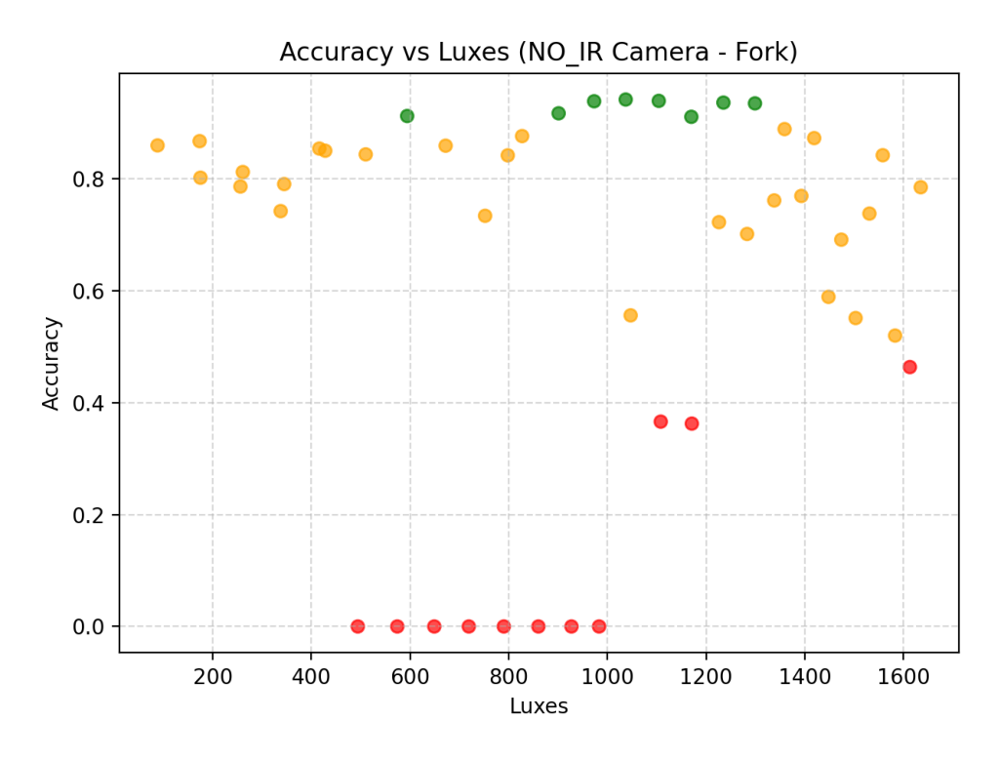

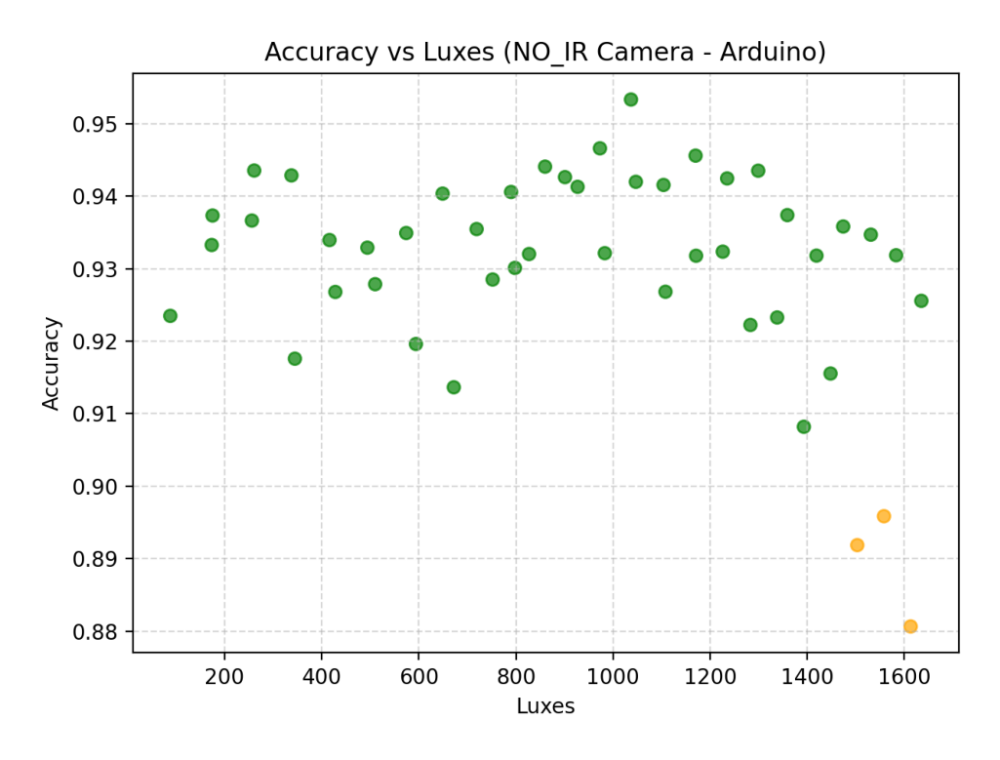

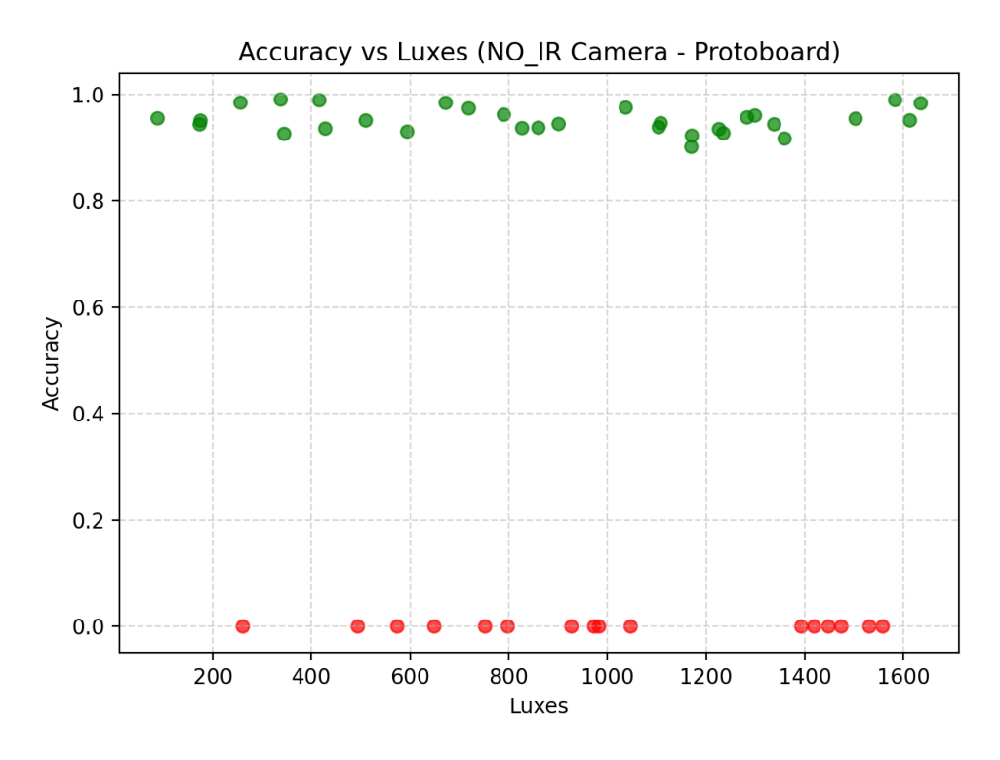

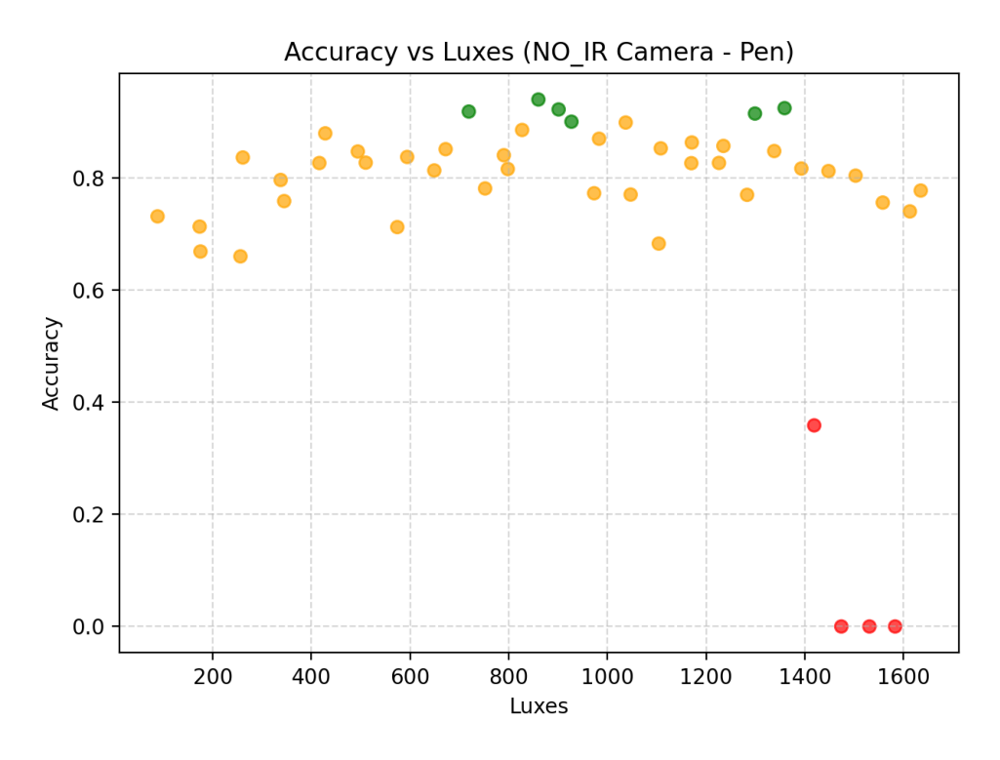

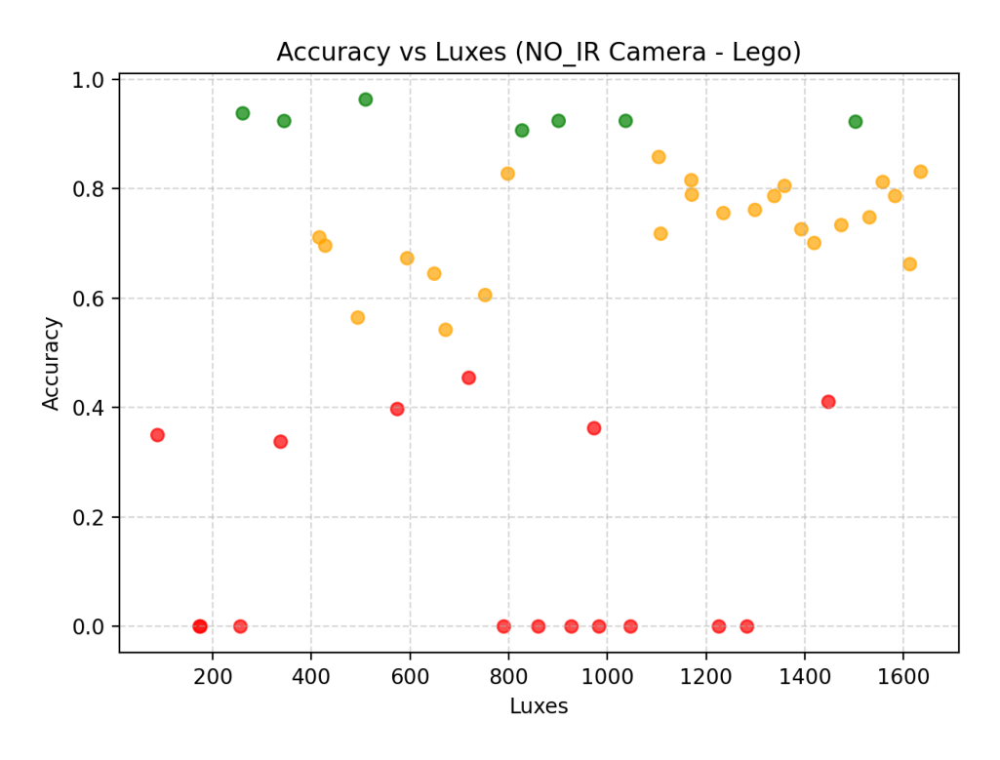

...

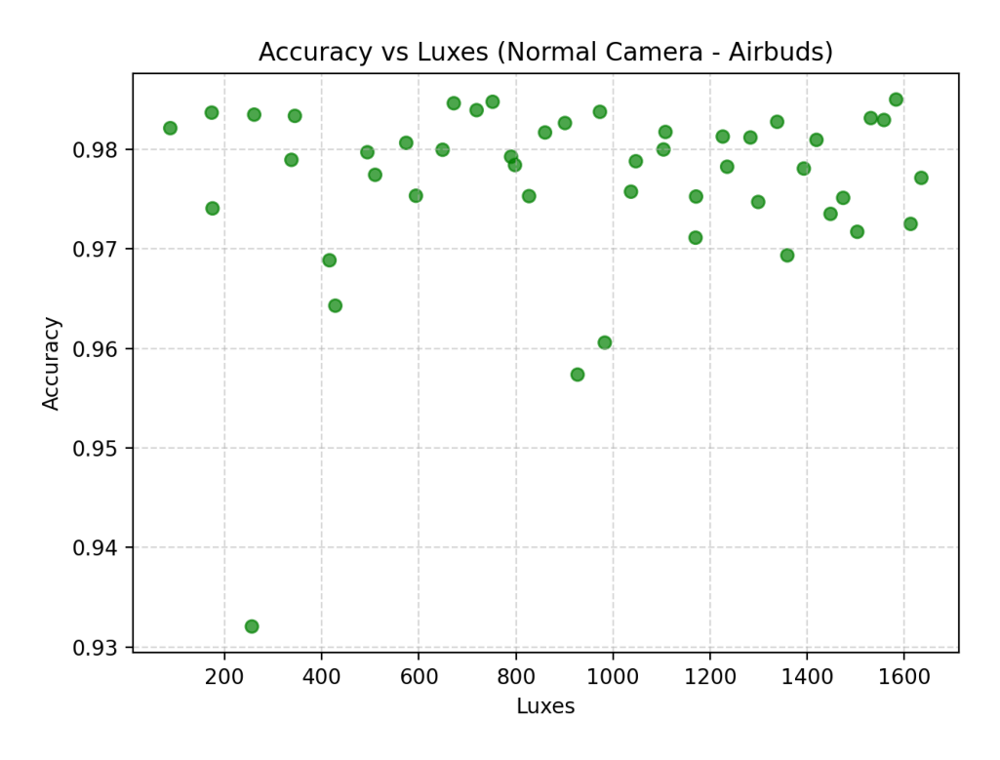

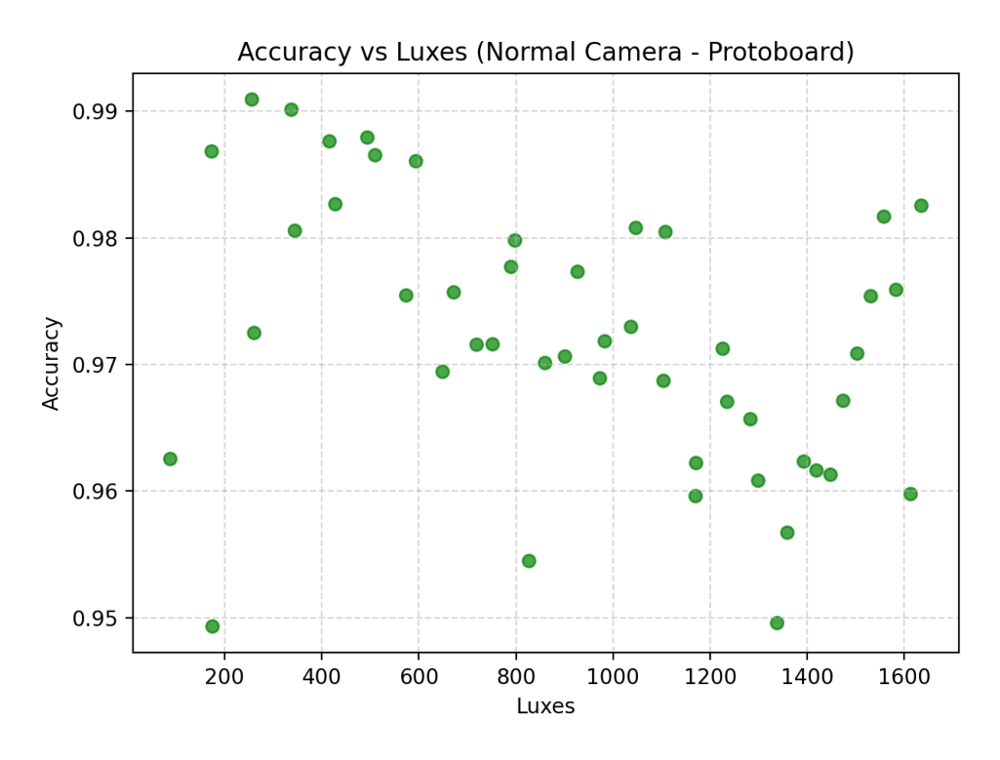

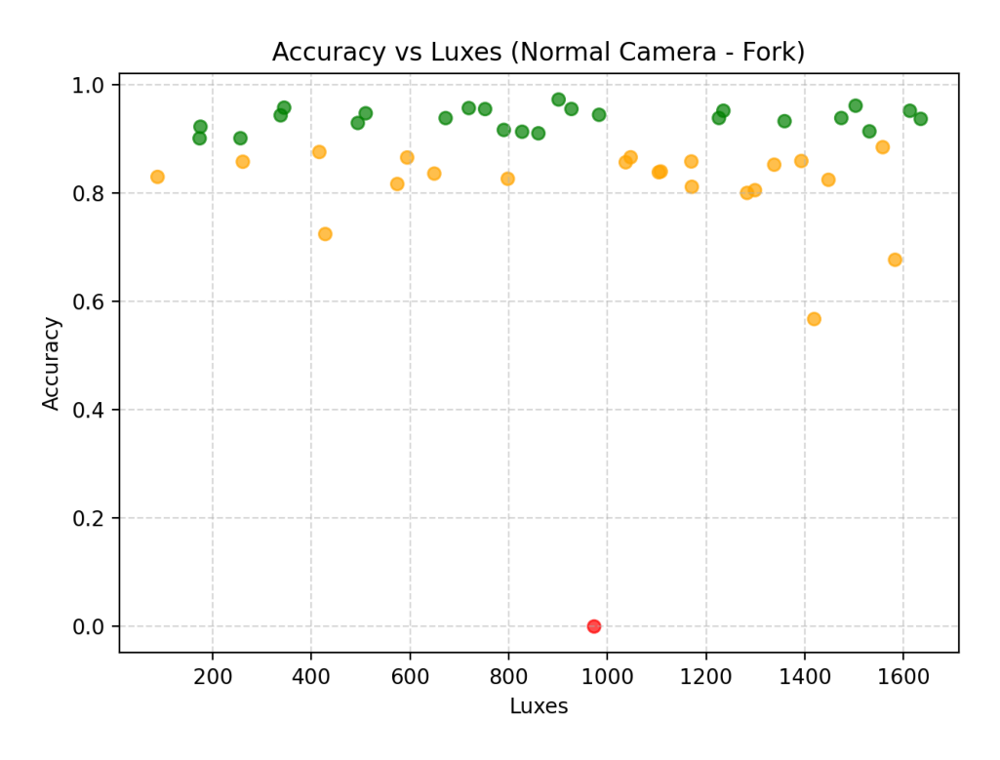

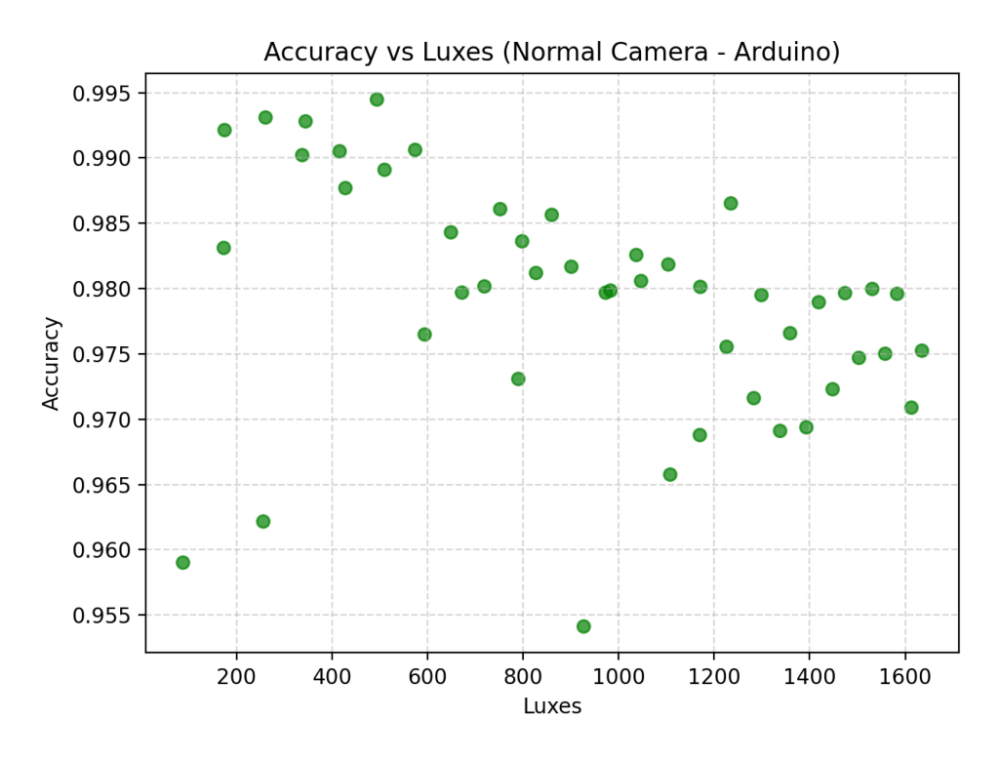

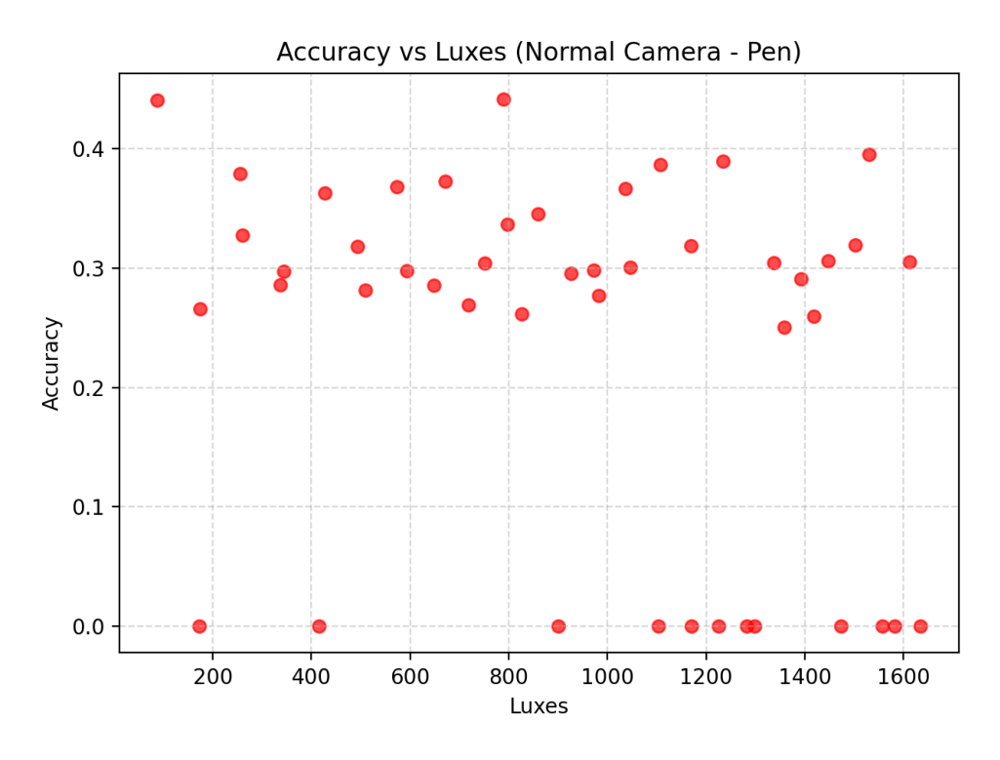

In [18]:
#Ploteamos ahora las figuras
#Primero vamos con las figuras de NO_IR:
NO_IR_Figs = "Figs/NO_IR"
Normal_Figs = "Figs/Normal"

#Vamos a plotear primero las imágenes NO_IR
NO_IR_Img_List = os.listdir(NO_IR_Figs)
for i in range(len(NO_IR_Img_List)):
    img_path = os.path.join(NO_IR_Figs, NO_IR_Img_List[i])
    plot_img_by_dir(img_path)

#Ahora ploteamos las normales
Normal_Img_List = os.listdir(Normal_Figs)
for i in range(len(Normal_Img_List)):
    img_path = os.path.join(Normal_Figs, Normal_Img_List[i])
    plot_img_by_dir(img_path)

In [19]:
#Ahora sí, vamos a obtener también las coordenadas de las bounding boxes
# Load the YOLO model
model = YOLO("models/best_yolo_5/best_model_5_saved_model/best_model_5_float16.tflite")

# Initialize arrays to store data
img_names = []
accuracies = []  # Store the highest confidence for each image
predicted_classes = []  # Store only the category with the highest confidence for each image
bounding_boxes = []  # Store the bounding box for the element with highest confidence

# Main folder containing images
main_folder = "new_images"
subfolders_1 = os.listdir(main_folder)

# Loop through subfolders and images
for i in range(len(subfolders_1)):
    main_folder_1 = os.path.join(main_folder, subfolders_1[i])
    subfolders_2 = os.listdir(main_folder_1)
    for j in range(len(subfolders_2)):
        main_folder_2 = os.path.join(main_folder_1, subfolders_2[j])
        images = os.listdir(main_folder_2)
        images = sorted(images, key=lambda x: int(''.join(filter(str.isdigit, x))))
        for k in range(len(images)):
            # Load and preprocess the image
            final_img_path = os.path.join(main_folder_2, images[k])
            final_img = cv.imread(final_img_path)
            img_names.append(final_img_path)  # Append the image name

            # Run prediction
            results = model.predict(final_img)

            # Initialize Annotator
            annotator = Annotator(final_img)
            max_confidence = 0.0  # Track the highest confidence for this image
            best_class = None  # Track the category with the highest confidence
            best_box = None  # Track the bounding box with the highest confidence

            for result in results:
                boxes = result.boxes
                for box in boxes:
                    b = box.xyxy[0].numpy()  # Bounding box coordinates
                    c = box.cls
                    confidence = box.conf[0].numpy()  # Confidence score of the detected object
                    
                    # Update max confidence, best class, and bounding box
                    if confidence > max_confidence:
                        max_confidence = confidence
                        best_class = model.names[int(c)]
                        best_box = b  # Update to the best bounding box

                    # Annotate the frame with box and label
                    annotator.box_label(b, f"{model.names[int(c)]} {confidence:.2f}")

            # Append the highest confidence, class, and bounding box
            accuracies.append(max_confidence)
            predicted_classes.append(best_class if best_class else "None")
            bounding_boxes.append(best_box if best_box is not None else [0, 0, 0, 0])

            # Display the annotated frame with the max confidence and class
            processed_frame = annotator.result()
            if best_class:
                cv.putText(
                    processed_frame,
                    f"Best: {best_class} ({max_confidence:.2%})",
                    (10, 30),
                    cv.FONT_HERSHEY_SIMPLEX,
                    0.7,
                    (0, 0, 255),
                    2,
                    cv.LINE_AA,
                )

            # Show the frame
            cv.imshow("Processed Frame", processed_frame)
            if cv.waitKey(1) & 0xFF == ord('q'):
                break

# Release OpenCV resources
cv.destroyAllWindows()
print("Done predicting")

# Print results for debugging
for idx in range(len(img_names)):
    print(f"Image: {img_names[idx]}")
    print(f"  Best Class: {predicted_classes[idx]}")
    print(f"  Confidence: {accuracies[idx]:.2f}")
    print(f"  Bounding Box: {bounding_boxes[idx]}")

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading models/best_yolo_5/best_model_5_saved_model/best_model_5_float16.tflite for TensorFlow Lite inference...

0: 640x640 1 protoboard, 1 esp32, 283.2ms
Speed: 29.2ms preprocess, 283.2ms inference, 17.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 378.2ms
Speed: 6.4ms preprocess, 378.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 242.9ms
Speed: 3.2ms preprocess, 242.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 258.7ms
Speed: 2.3ms preprocess, 258.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 1 esp32, 248.3ms
Speed: 3.3ms preprocess, 248.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 6

In [20]:
luxes = np.load("Luxes_array.npy")
luxes = np.concatenate([luxes]*14)
data = {
    "Image Name": img_names,
    "Predicted Class": predicted_classes,
    "Accuracy": accuracies,
    "Bounding Box": bounding_boxes,
    "Luxes": luxes
}

df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
output_csv_path = "predictions_output.csv"
df.to_csv(output_csv_path, index=False)

print(f"Data saved to {output_csv_path}")

Data saved to predictions_output.csv


In [10]:
# Cargamos la base de datos y aislamos la columna del nombre de la imagen y las coordenadas del objeto para extraerlo posteriormente
db_with_coordinates = pd.read_csv("predictions_output.csv")
#Vemos la base de datos
db_with_coordinates.head()

,Image Name,Predicted Class,Accuracy,Bounding Box,Luxes
0,new_images/NORMAL/protoboard/protoboard_1.jpg,protoboard,0.959771,[ 159.13 242.56 559.32 387.83],1613.0
1,new_images/NORMAL/protoboard/protoboard_2.jpg,protoboard,0.981685,[ 158.86 243.02 559.25 388.44],1558.0
2,new_images/NORMAL/protoboard/protoboard_3.jpg,protoboard,0.970869,[ 159.32 242.58 559.31 388.51],1503.0
3,new_images/NORMAL/protoboard/protoboard_4.jpg,protoboard,0.961301,[ 159.12 242.49 558.74 387.33],1448.0
4,new_images/NORMAL/protoboard/protoboard_5.jpg,protoboard,0.962341,[ 159.16 243.3 558.39 387.39],1393.0


In [11]:
# Obtenemos las columnas que nos interesan
img_names = db_with_coordinates["Image Name"]
bounding_boxes = db_with_coordinates["Bounding Box"]

# Convertimos las columnas en arreglos de numpy
img_names_array = np.array(img_names)
bounding_boxes_array = np.array(bounding_boxes)

# Tomamos las coordenadas de prueba
test_coordinates = bounding_boxes_array[0]

# Inicializamos el arreglo para almacenar los números procesados
new_bounding_boxes_array = []
for i in range(len(bounding_boxes_array)):
    test_coordinates = bounding_boxes_array[i]
    array = []

    # Procesamos cada carácter de las coordenadas
    number = ""
    for char in test_coordinates:
        # Si el carácter es un dígito, un punto decimal, o un signo negativo, lo agregamos al número en construcción
        if char.isdigit() or char == '.' or char == '-':
            number += char
        # Si encontramos un espacio o un corchete que indica el fin de un número, procesamos el número actual
        elif number:
            # Convertimos el número a float y luego a int (eliminando los decimales)
            array.append(int(float(number)))
            number = ""  # Reiniciamos para procesar el siguiente número

    # Si hay un número pendiente después de recorrer el string, lo procesamos
    if number:
        array.append(int(float(number)))

    if len(array) == 4:
        new_bounding_boxes_array.append(array)

#Checamos la longitud de ambos arreglos
print("Longitud arreglo de imágenes: ")
print(len(img_names_array))
print("Longitud de arreglo de las bounding boxes: ")
print(len(new_bounding_boxes_array))
#Excelente

Longitud arreglo de imágenes: 
658
Longitud de arreglo de las bounding boxes: 
658


Coordinates of object 0:
[159, 242, 559, 387]


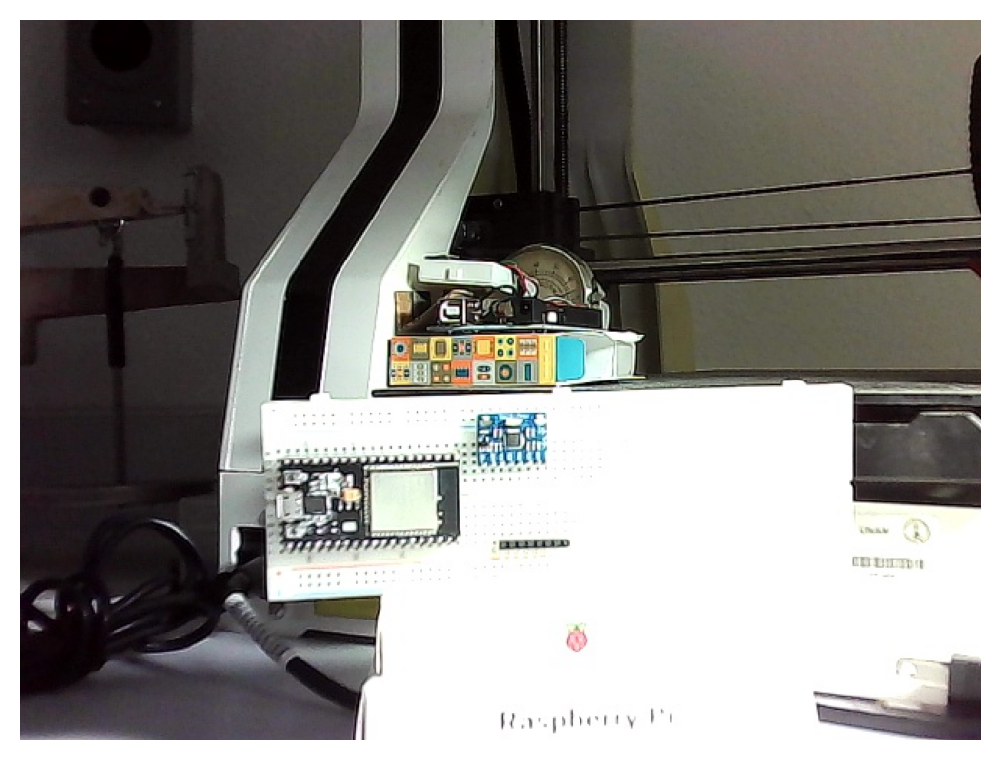

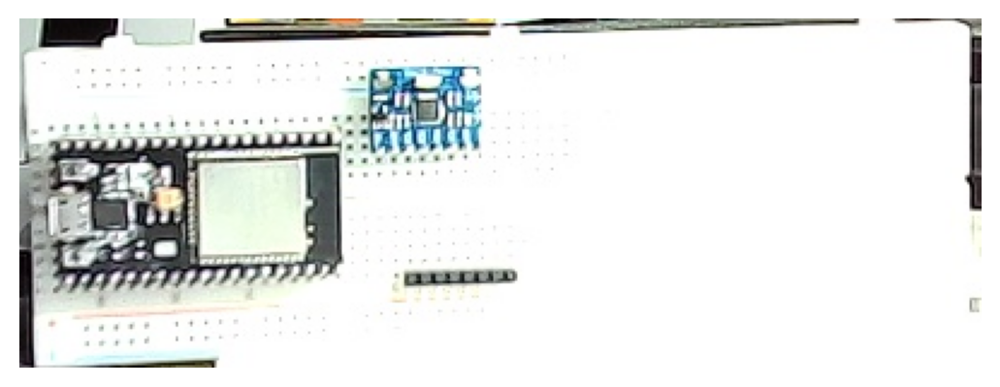

In [9]:
#Vamos a ver una imágen recortado por sus respectivas coordenadas
img = Image.open(img_names_array[0])
img = np.array(img)

#Imagen original
plot_img_by_array(img)

#Vemos las coordenadas de la primera imágen en el objeto detectado
coordinates = new_bounding_boxes_array[0]
print("Coordinates of object 0:")
print(coordinates)

#Vamos a ver las coordenadas 
x_min, y_min, x_max, y_max = map(int, coordinates)

# Verificamos que las coordenadas estén dentro de los límites de la imagen
h, w, _ = img.shape  # Altura y anchura de la imagen
x_min = max(0, min(x_min, w - 1))
y_min = max(0, min(y_min, h - 1))
x_max = max(0, min(x_max, w - 1))
y_max = max(0, min(y_max, h - 1))

# Recortamos la imagen usando las coordenadas
new_img = img[y_min:y_max, x_min:x_max, :]

plot_img_by_array(new_img)

In [7]:
db = pd.read_csv("predictions_output.csv")

In [12]:
#Leemos la base de datos de una vez
db = pd.read_csv("predictions_output.csv")

# Directory to save trimmed images
dir = "trimmed_imgs"
if not os.path.exists(dir):
    os.makedirs(dir)

# Original arrays containing data
img_names_array = db["Image Name"]
accuracies_array_original = db["Accuracy"]
luxes_array_original = db["Luxes"]
new_bounding_boxes_array
# Arrays to store new data
img_names = []
accuracies_array = []
luxes_array = []

Normal = "NORMAL"
NO_IR = "NO_IR"

for i in range(len(img_names_array)):
    img_path = img_names_array[i]
    coordinates = new_bounding_boxes_array[i]

    # Load the image
    img = Image.open(img_path)
    img = np.array(img)

    # Verify if there are valid coordinates
    if coordinates is None or len(coordinates) == 0:
        # If no coordinates, save the full image
        img_name = os.path.basename(img_path)
        full_path = os.path.join(dir, img_name)
        im = Image.fromarray(img)
        im.save(full_path)
        print(f"Full image saved at: {full_path}")
        continue

    # Process valid coordinates
    x_min, y_min, x_max, y_max = map(int, coordinates)

    # Ensure coordinates are within image bounds
    h, w, _ = img.shape
    x_min = max(0, min(x_min, w - 1))
    y_min = max(0, min(y_min, h - 1))
    x_max = max(0, min(x_max, w - 1))
    y_max = max(0, min(y_max, h - 1))

    # Ensure valid trimmed area
    if x_max <= x_min or y_max <= y_min:
        print(f"Invalid coordinates for image: {img_path}, cannot trim.")
        continue

    # Trim the image
    new_img = img[y_min:y_max, x_min:x_max, :]

    # Determine if image is NORMAL or NO_IR
    if Normal in img_path:
        img_name = "NORMAL_" + os.path.basename(img_path)
        folders_path = os.path.join(dir, Normal)
        if not os.path.exists(folders_path):
            os.makedirs(folders_path)
        full_path = os.path.join(folders_path, img_name)
    elif NO_IR in img_path:
        img_name = "NO_IR_" + os.path.basename(img_path)
        folders_path = os.path.join(dir, NO_IR)
        if not os.path.exists(folders_path):
            os.makedirs(folders_path)
        full_path = os.path.join(folders_path, img_name)

    # Save the trimmed image
    im = Image.fromarray(new_img)
    im.save(full_path)
    print(f"Trimmed image saved at: {full_path}")

    # Append details for trimmed images
    img_names.append(img_name)
    accuracies_array.append(accuracies_array_original[i])
    luxes_array.append(luxes_array_original[i])

# At this point, `img_names`, `accuracies_array`, and `luxes_array` contain the data for trimmed images
print("Processing completed.")

Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_1.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_2.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_3.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_4.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_5.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_6.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_7.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_8.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_9.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_10.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_11.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_12.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_13.jpg
Trimmed image saved at: trimmed_imgs/NORMAL/NORMAL_protoboard_14.jpg
Trimmed image saved at: trimmed_imgs/NORMAL

In [13]:
# Load the CSV file containing image names
db = pd.read_csv("predictions_output.csv")
all_names = np.array(db["Image Name"])

# List the files in the directories
trimmed_NO_IR = os.listdir("trimmed_imgs/NO_IR")
trimmed_Normal = os.listdir("trimmed_imgs/NORMAL")

# Lists to track images not found in the directories
Not_in_Normal = []
Not_in_IR = []

# Check each image name against the trimmed directories
for i in range(len(all_names)):
    img_base_name = os.path.basename(all_names[i])  # Get the base name of the image

    if "NO_IR" in all_names[i]:  # Check NO_IR directory
        found = False
        for trimmed_img in trimmed_NO_IR:
            if img_base_name in trimmed_img:
                found = True
                break
        if not found:
            Not_in_IR.append(img_base_name)  # Add to the list if not found

    elif "NORMAL" in all_names[i]:  # Check NORMAL directory
        found = False
        for trimmed_img in trimmed_Normal:
            if img_base_name in trimmed_img:
                found = True
                break
        if not found:
            Not_in_Normal.append(img_base_name)  # Add to the list if not found

# Output results
print(f"Images not found in NO_IR: {Not_in_IR}")
print(f"Images not found in NORMAL: {Not_in_Normal}")

Images not found in NO_IR: ['lego_22.jpg', 'lego_23.jpg', 'lego_25.jpg', 'pen_44.jpg', 'pen_45.jpg', 'pen_46.jpg', 'fork_12.jpg', 'fork_13.jpg', 'fork_14.jpg', 'fork_16.jpg']
Images not found in NORMAL: ['pen_2.jpg', 'pen_7.jpg', 'pen_8.jpg', 'pen_9.jpg', 'pen_20.jpg', 'pen_23.jpg', 'pen_35.jpg', 'pen_38.jpg', 'pen_41.jpg', 'pen_44.jpg', 'pen_46.jpg', 'pen_47.jpg', 'fork_36.jpg', 'marker_11.jpg']


In [14]:
#Guardamos los arreglos para checarlos luego
np.save("Not_trimmed_images/Not_trimmed_NO_IR_images.npy", Not_in_IR)
np.save("Not_trimmed_images/Not_trimmed_Normal_images.npy", Not_in_Normal)

In [16]:
#Vamos ahora a hacer un csv donde tengamos el nombre de las imágenes, el accuracy, los luxes y los colores RGB
#Vamos primero a checar las longitudes de todos los arreglos para asegurarnos de poder hacer el dataframe
print(len(img_names)) #Nombres de las imágenes
print(len(accuracies_array)) #Accuracy de las imágenes
print(len(luxes_array)) #Luxes de las imágenes
#Todas miden lo mismo
#Vamos a dar un vistazo a los nombres de las imágenes
for i in range(10):
    print(img_names[i])

634
634
634
NORMAL_protoboard_1.jpg
NORMAL_protoboard_2.jpg
NORMAL_protoboard_3.jpg
NORMAL_protoboard_4.jpg
NORMAL_protoboard_5.jpg
NORMAL_protoboard_6.jpg
NORMAL_protoboard_7.jpg
NORMAL_protoboard_8.jpg
NORMAL_protoboard_9.jpg
NORMAL_protoboard_10.jpg


In [17]:
#Vamos a obtener las desviaciones estándar de cada imagen recortada
#Vamos con el nombre de las imágenes
NO_IR_trimmed_names = []
NORMAL_trimmed_names = []

#Ahora con los accuracies
NO_IR_trimmed_acc = []
NORMAL_trimmed_acc = []

#Ahora con los luxes
NO_IR_trimmed_luxes = []
NORMAL_trimmed_luxes = []

for i in range(len(img_names)):
    if ("NORMAL" in img_names[i]):
        NORMAL_trimmed_names.append(img_names[i])
        NORMAL_trimmed_acc.append(accuracies_array[i])
        NORMAL_trimmed_luxes.append(luxes_array[i])
    elif ("NO_IR" in img_names[i]):
        NO_IR_trimmed_names.append(img_names[i])
        NO_IR_trimmed_acc.append(accuracies_array[i])
        NO_IR_trimmed_luxes.append(luxes_array[i])

In [19]:
#Ahora sí, vamos a generar un csv con estos datos
#Checamos la longitud de todos los arreglos solo para checar que esten bien
#Vamos con los normal
print(len(NORMAL_trimmed_names))
print(len(NORMAL_trimmed_acc))
print(len(NORMAL_trimmed_luxes))

#Vamos ahora con el NO_IR
print(len(NO_IR_trimmed_names))
print(len(NO_IR_trimmed_acc))
print(len(NO_IR_trimmed_luxes))

#Ahora sí, vamos a crear las bd
db_NORMAL = {
    "Img Names": NORMAL_trimmed_names,
    "Acc": NORMAL_trimmed_acc,
    "Luxes": NORMAL_trimmed_luxes
}

db_NO_IR = {
    "Img Names": NO_IR_trimmed_names,
    "Acc": NO_IR_trimmed_acc,
    "Luxes": NO_IR_trimmed_luxes
}

#Creamos el dataframe
db_NORMAL = pd.DataFrame(db_NORMAL)
db_NO_IR = pd.DataFrame(db_NO_IR)

#Guardamos como csv
db_NORMAL.to_csv("NORMAL_DB.csv", index=False)
db_NO_IR.to_csv("NO_IR_DB.csv", index=False)

315
315
315
319
319
319


In [22]:
#Ahora ya con estas, vamos a obtener la desviación estándar de cada imágen
NO_IR_Folder = "trimmed_imgs/NO_IR"
Normal_Folder = "trimmed_imgs/NORMAL"

db_NO_IR = pd.read_csv("NO_IR_DB.csv")
db_NORMAL = pd.read_csv("NORMAL_DB.csv")

NO_IR_Imgs = np.array(db_NO_IR["Img Names"])
NORMAL_Imgs = np.array(db_NORMAL["Img Names"])

NO_IR_std = []
#Vamos primero por las NO_IR
for i in range(len(NO_IR_Imgs)):
    full_img_path = os.path.join(NO_IR_Folder, NO_IR_Imgs[i])
    img = np.array(Image.open(full_img_path))
    mean_array, mode_array, std_array = mean_mode_std_per_channel(img)
    NO_IR_std.append(std_array)

NORMAL_std = []
for i in range(len(NORMAL_Imgs)):
    full_img_path = os.path.join(Normal_Folder, NORMAL_Imgs[i])
    img = np.array(Image.open(full_img_path))
    mean_array, mode_array, std_array = mean_mode_std_per_channel(img)
    NORMAL_std.append(std_array)

In [23]:
#Vamos a guardarlos para ya terminar por hoy y no perder progreso
np.save("NO_IR_std.npy", NO_IR_std)
np.save("NORMAL_std", NORMAL_std)

In [8]:
#Vamos a cargar los datos de desviación estándar y dividr por canal
NORMAL_std = np.load("NORMAL_std.npy")
NO_IR_std = np.load("NO_IR_std.npy")

#Vamos a ver el shape, solo para asegurarnos que sean 3 canales
print(NORMAL_std.shape)
print(NO_IR_std.shape)

#Dividimos por canal
#Normal
NORMAL_STD_Red = NORMAL_std[:, 0]
NORMAL_STD_Green = NORMAL_std[:, 1]
NORMAL_STD_Blue = NORMAL_std[:, 2]

#NO_IR
NO_IR_STD_Red = NO_IR_std[:, 0]
NO_IR_STD_Green = NO_IR_std[:, 1]
NO_IR_STD_Blue = NO_IR_std[:, 2]

(315, 3)
(319, 3)


In [ ]:
#Ahora vamos a dividir por canal y hacer el append a NO_IR_DB y NORMAL_DB
#Cargamos ambas bases
db_NORMAL = pd.read_csv("NORMAL_DB.csv")
db_NO_IR = pd.read_csv("NO_IR_DB.csv")

#Dividimos en sus arreglos individuales
#Vamos con la NORMAL
NORMAL_Img_Names = np.array(db_NORMAL["Img Names"])
NORMAL_Acc = np.array(db_NORMAL["Acc"])
NORMAL_Luxes = np.array(db_NORMAL["Luxes"])

#Vamos con la NO_IR
NO_IR_Img_Names = np.array(db_NO_IR["Img Names"])
NO_IR_Acc = np.array(db_NO_IR["Acc"])
NO_IR_Luxes = np.array(db_NO_IR["Luxes"])

#Checamos que tengan la misma longitud que aquellos arreglos 
#Normal
print(len(NORMAL_Img_Names))
print(len(NORMAL_STD_Red))

#NO_IR
print(len(NO_IR_Img_Names))
print(len(NO_IR_STD_Red))
#Vemos que coinciden

315
315
319
319


In [12]:
#Hacemos las nuevas bases de datos
#Normal
db_NORMAL = {
    "Img Names": NORMAL_Img_Names,
    "Acc": NORMAL_Acc,
    "STD_Red": NORMAL_STD_Red,
    "STD_Green": NORMAL_STD_Green,
    "STD_Blue": NORMAL_STD_Blue,
    "Luxes": NORMAL_Luxes
}

db_NORMAL = pd.DataFrame(db_NORMAL)

db_NORMAL.to_csv("NORMAL_DB_With_STD.csv", index = False)

#NO_IR
db_NO_IR = {
    "Img Names": NO_IR_Img_Names,
    "Acc": NO_IR_Acc,
    "STD_Red": NO_IR_STD_Red,
    "STD_Green": NO_IR_STD_Green,
    "STD_Blue": NO_IR_STD_Blue,
    "Luxes": NO_IR_Luxes
}

db_NO_IR = pd.DataFrame(db_NO_IR)

db_NO_IR.to_csv("NO_IR_DB_With_STD.csv", index = False)

In [4]:
#Vamos a hacer algunas gráficas
#Cargamos las bases de datos
db_NORMAL = pd.read_csv("NORMAL_DB_With_STD.csv")
db_NO_IR = pd.read_csv("NO_IR_DB_With_STD.csv")

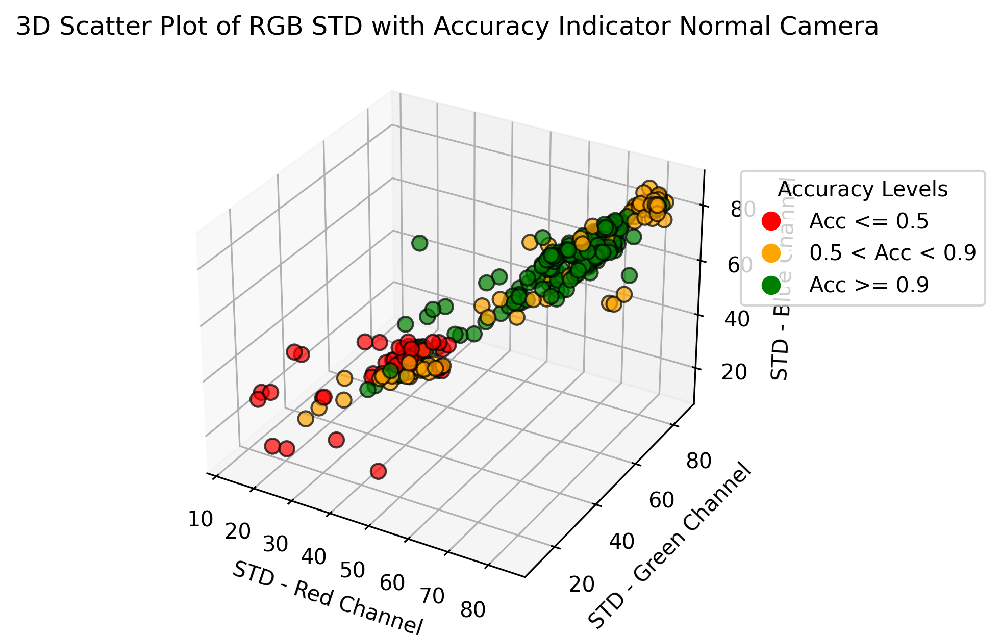

In [5]:
#Sacamos el accuracy como la desviación estándar
db_NORMAL_acc = db_NORMAL["Acc"]
db_NORMAL_STD_Red = db_NORMAL["STD_Red"]
db_NORMAL_STD_Green = db_NORMAL["STD_Green"]
db_NORMAL_STD_Blue = db_NORMAL["STD_Blue"]

#Vamos a graficar un scatter plot usando como ejes RGB y el Acc como indicador
#Si Acc<=0.5 Rojo, 0.5<Acc<0.9 Naranja, Acc=>0.9 Verde
# Assign colors based on accuracy conditions
colors = np.where(
    db_NORMAL_acc <= 0.5, 'red',
    np.where(db_NORMAL_acc < 0.9, 'orange', 'green')
)
# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    db_NORMAL_STD_Red, db_NORMAL_STD_Green, db_NORMAL_STD_Blue,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Accuracy Indicator Normal Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_Normal_By_Acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

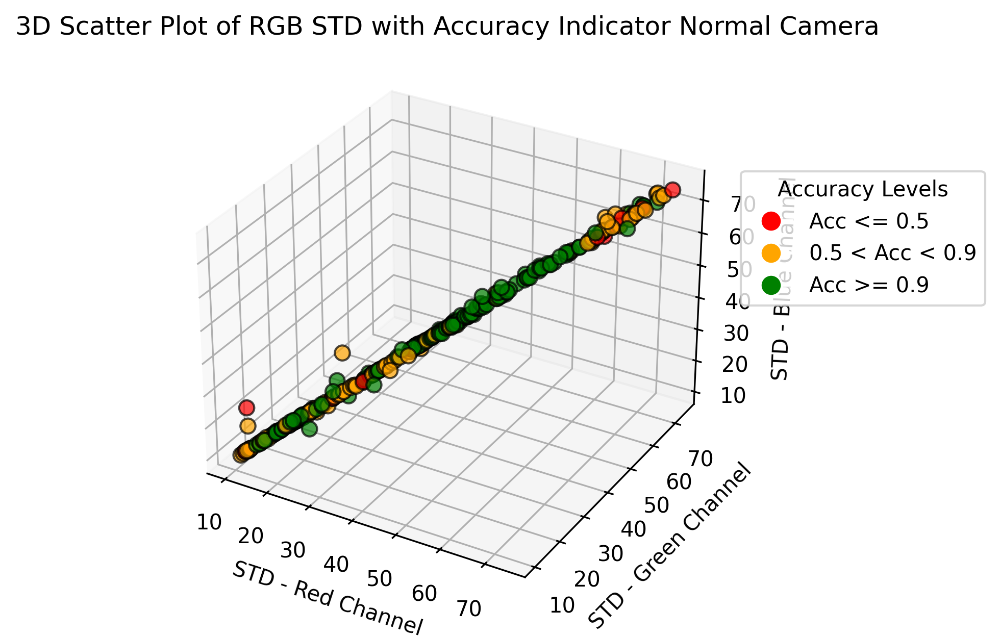

In [ ]:
#Hacemos lo mismo para NO_IR
db_NO_IR_acc = db_NO_IR["Acc"]
db_NO_IR_STD_Red = db_NO_IR["STD_Red"]
db_NO_IR_STD_Green = db_NO_IR["STD_Green"]
db_NO_IR_STD_Blue = db_NO_IR["STD_Blue"]
colors = np.where(
    db_NO_IR_acc <= 0.5, 'red',
    np.where(db_NO_IR_acc < 0.9, 'orange', 'green')
)
# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    db_NO_IR_STD_Red, db_NO_IR_STD_Green, db_NO_IR_STD_Blue,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Accuracy Indicator NO_IR Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_NO_IR_By_Acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

In [7]:
#Vamos ahora a plotearlos por accuracy
#Hacemos una matriz con STD_R, STD_G, STD_B
#Iniciamos con la normal
db_NORMAL_matrix = np.array(db_NORMAL)

minor_acc_NORMAL_matrix = []
medium_acc_NORMAL_matrix = []
mayor_acc_NORMAL_matrix = []

rows, cols = db_NORMAL_matrix.shape
for i in range(rows):
    acc = db_NORMAL_matrix[i, 1]
    if (acc <0.5):
        minor_acc_NORMAL_matrix.append(db_NORMAL_matrix[i, :])
    elif (acc >= 0.9):
        mayor_acc_NORMAL_matrix.append(db_NORMAL_matrix[i, :])
    else:
        medium_acc_NORMAL_matrix.append(db_NORMAL_matrix[i, :])

In [8]:
#Ahora lo hacemos con el NO_IR
db_NO_IR_matrix = np.array(db_NO_IR)

minor_acc_NO_IR_matrix = []
medium_acc_NO_IR_matrix = []
mayor_acc_NO_IR_matrix = []

rows, cols = db_NO_IR_matrix.shape
for i in range(rows):
    acc = db_NO_IR_matrix[i, 1]
    if (acc <0.5):
        minor_acc_NO_IR_matrix.append(db_NO_IR_matrix[i, :])
    elif (acc >= 0.9):
        mayor_acc_NO_IR_matrix.append(db_NO_IR_matrix[i, :])
    else:
        medium_acc_NO_IR_matrix.append(db_NO_IR_matrix[i, :])

In [9]:
#Vamos a plotear entonces primero las de menor accuracy
#Vamos con la NORMAL
#Damos un vistazo a la matriz con menores accuracies
for i in range(5):
    print(np.array(minor_acc_NORMAL_matrix[i]))

['NORMAL_pen_1.jpg' 0.30469573 41.16276616014324 40.404035232296685 36.66864967899753 1613.0]
['NORMAL_pen_3.jpg' 0.31885323 41.451941359915416 41.97630282647218 40.965729590943134 1503.0]
['NORMAL_pen_4.jpg' 0.30559897 40.45116948296473 40.85866951334283 39.82305009470038 1448.0]
['NORMAL_pen_5.jpg' 0.29045418 43.60367041272893 42.19237019223413 41.64051214635862 1393.0]
['NORMAL_pen_6.jpg' 0.30399385 12.736120367001227 20.50001672855552 25.740127890386304 1338.0]


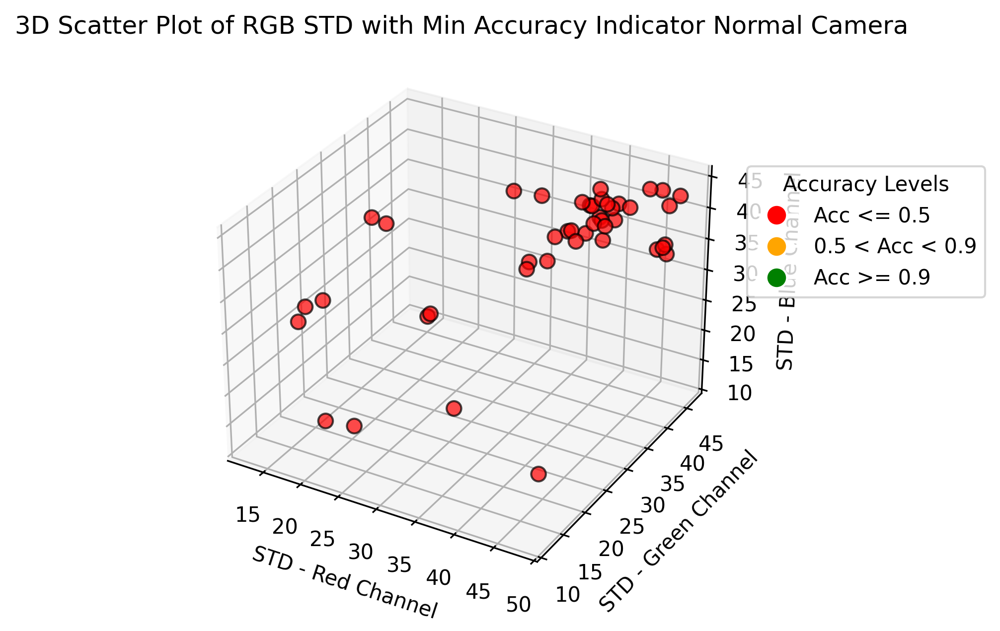

In [10]:
minor_acc_NORMAL_matrix = np.array(minor_acc_NORMAL_matrix)

# Separate accuracies and STD values
minor_acc_normal = minor_acc_NORMAL_matrix[:, 1]
minor_STD_R_normal = minor_acc_NORMAL_matrix[:, 2]
minor_STD_G_normal = minor_acc_NORMAL_matrix[:, 3]
minor_STD_B_normal = minor_acc_NORMAL_matrix[:, 4]

# Assign colors based on accuracy conditions
colors = np.where(
    minor_acc_normal <= 0.5, 'red',
    np.where(minor_acc_normal < 0.9, 'orange', 'green')
)

# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    minor_STD_R_normal, minor_STD_G_normal, minor_STD_B_normal,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Min Accuracy Indicator Normal Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_NORMAL_min_acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

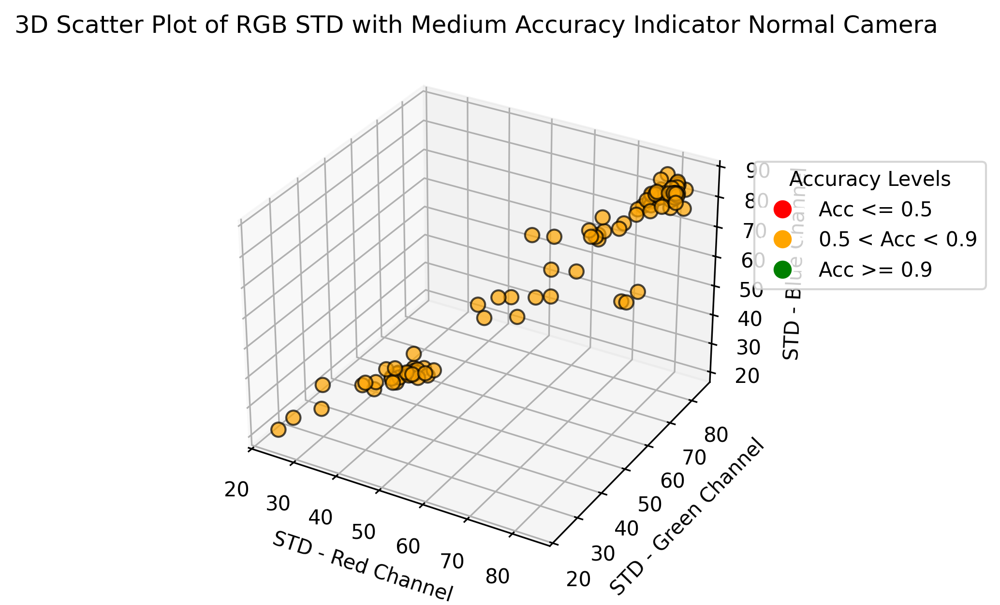

In [11]:
medium_acc_NORMAL_matrix = np.array(medium_acc_NORMAL_matrix)

# Separate accuracies and STD values
medium_acc_normal = medium_acc_NORMAL_matrix[:, 1]
medium_STD_R_normal = medium_acc_NORMAL_matrix[:, 2]
medium_STD_G_normal = medium_acc_NORMAL_matrix[:, 3]
medium_STD_B_normal = medium_acc_NORMAL_matrix[:, 4]

# Assign colors based on accuracy conditions
colors = np.where(
    medium_acc_normal <= 0.5, 'red',
    np.where(medium_acc_normal < 0.9, 'orange', 'green')
)

# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    medium_STD_R_normal, medium_STD_G_normal, medium_STD_B_normal,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Medium Accuracy Indicator Normal Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_NORMAL_mid_acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

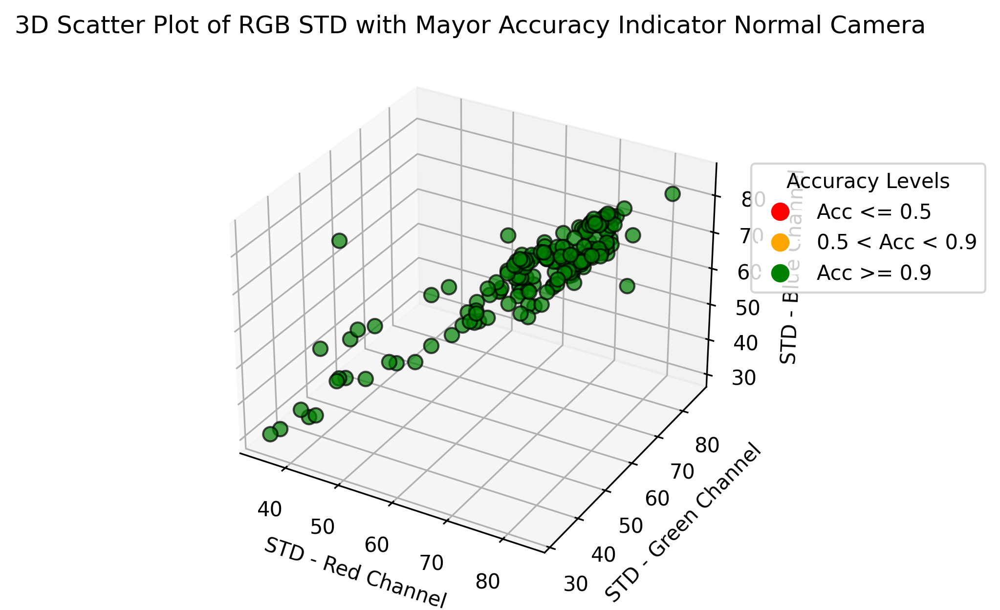

In [12]:
mayor_acc_NORMAL_matrix = np.array(mayor_acc_NORMAL_matrix)

# Separate accuracies and STD values
mayor_acc_normal = mayor_acc_NORMAL_matrix[:, 1]
mayor_STD_R_normal = mayor_acc_NORMAL_matrix[:, 2]
mayor_STD_G_normal = mayor_acc_NORMAL_matrix[:, 3]
mayor_STD_B_normal = mayor_acc_NORMAL_matrix[:, 4]

# Assign colors based on accuracy conditions
colors = np.where(
    mayor_acc_normal <= 0.5, 'red',
    np.where(mayor_acc_normal < 0.9, 'orange', 'green')
)

# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    mayor_STD_R_normal, mayor_STD_G_normal, mayor_STD_B_normal,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Mayor Accuracy Indicator Normal Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_NORMAL_mayor_acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

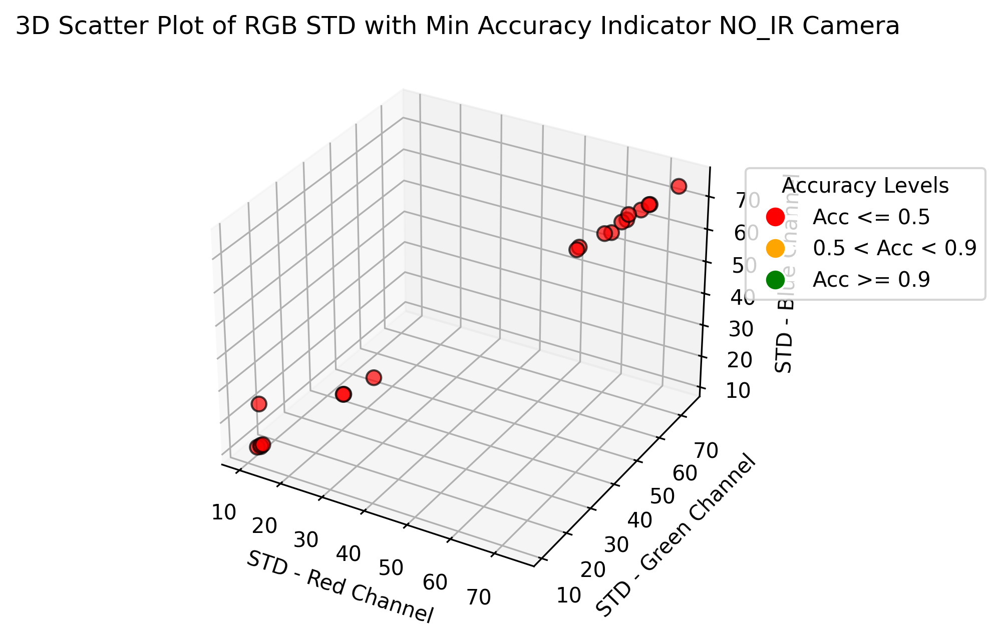

In [13]:
#Ahora vamos con aquellas que son NO_IR
minor_acc_NO_IR_matrix = np.array(minor_acc_NO_IR_matrix)

# Separate accuracies and STD values
minor_acc_NO_IR = minor_acc_NO_IR_matrix[:, 1]
minor_STD_R_NO_IR = minor_acc_NO_IR_matrix[:, 2]
minor_STD_G_NO_IR = minor_acc_NO_IR_matrix[:, 3]
minor_STD_B_NO_IR = minor_acc_NO_IR_matrix[:, 4]

# Assign colors based on accuracy conditions
colors = np.where(
    minor_acc_NO_IR <= 0.5, 'red',
    np.where(minor_acc_NO_IR < 0.9, 'orange', 'green')
)

# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    minor_STD_R_NO_IR, minor_STD_G_NO_IR, minor_STD_B_NO_IR,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Min Accuracy Indicator NO_IR Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_NO_IR_min_acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

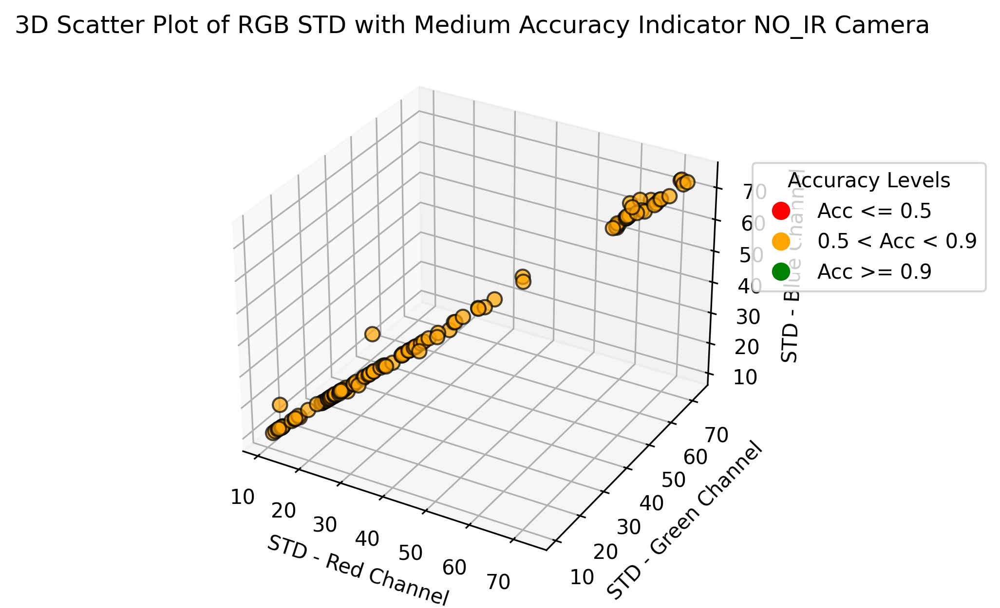

In [14]:
#Ahora vamos con aquellas que son NO_IR
medium_acc_NO_IR_matrix = np.array(medium_acc_NO_IR_matrix)

# Separate accuracies and STD values
medium_acc_NO_IR = medium_acc_NO_IR_matrix[:, 1]
medium_STD_R_NO_IR = medium_acc_NO_IR_matrix[:, 2]
medium_STD_G_NO_IR = medium_acc_NO_IR_matrix[:, 3]
medium_STD_B_NO_IR = medium_acc_NO_IR_matrix[:, 4]

# Assign colors based on accuracy conditions
colors = np.where(
    medium_acc_NO_IR <= 0.5, 'red',
    np.where(medium_acc_NO_IR < 0.9, 'orange', 'green')
)

# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    medium_STD_R_NO_IR, medium_STD_G_NO_IR, medium_STD_B_NO_IR,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Medium Accuracy Indicator NO_IR Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_NO_IR_Mid_Acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

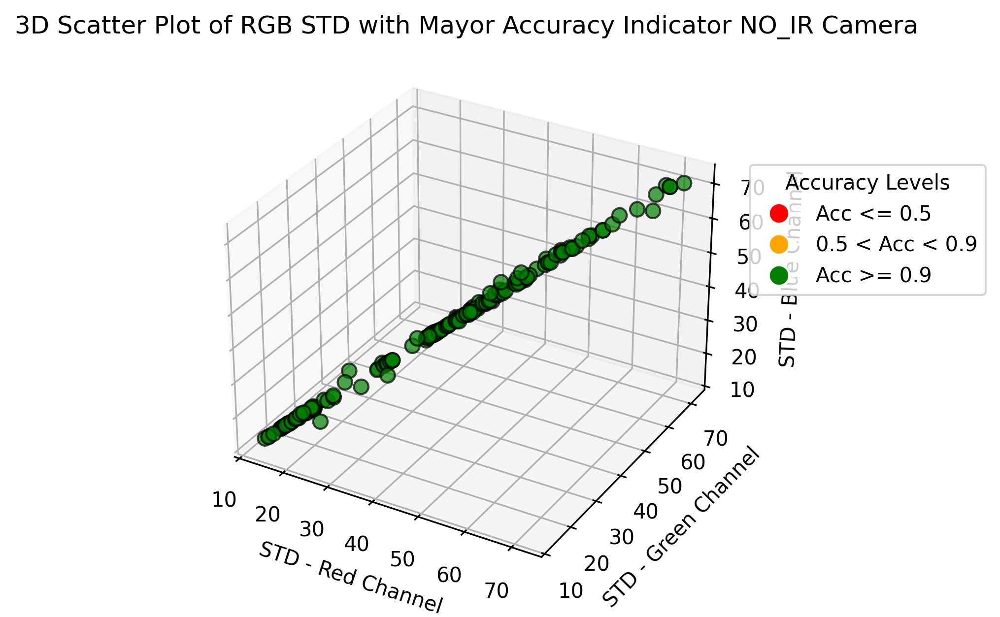

In [15]:
#Ahora vamos con aquellas que son NO_IR
mayor_acc_NO_IR_matrix = np.array(mayor_acc_NO_IR_matrix)

# Separate accuracies and STD values
mayor_acc_NO_IR = mayor_acc_NO_IR_matrix[:, 1]
mayor_STD_R_NO_IR = mayor_acc_NO_IR_matrix[:, 2]
mayor_STD_G_NO_IR = mayor_acc_NO_IR_matrix[:, 3]
mayor_STD_B_NO_IR = mayor_acc_NO_IR_matrix[:, 4]

# Assign colors based on accuracy conditions
colors = np.where(
    mayor_acc_NO_IR <= 0.5, 'red',
    np.where(mayor_acc_NO_IR < 0.9, 'orange', 'green')
)

# Create a 3D scatter plot
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    mayor_STD_R_NO_IR, mayor_STD_G_NO_IR, mayor_STD_B_NO_IR,
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Set axis labels and title
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Mayor Accuracy Indicator NO_IR Camera")

# Create a legend based on accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))

# Save the figure before showing it
plt.savefig("3D_Scatter_NO_IR_Mayor_Acc.png", dpi=300, bbox_inches="tight")

# Show plot
plt.show()

In [7]:
#Vamos a hacer los paths para obtener el STD de las imágenes completas
NORMAL_Path = pd.read_csv("NORMAL_DB_With_STD.csv")
NO_IR_Path = pd.read_csv("NO_IR_DB_With_STD.csv")

NORMAL_Path = np.array(NORMAL_Path["Img Names"])
NO_IR_Path = np.array(NO_IR_Path["Img Names"])

#Vamos a ver un ejemplo de como sale el nombre de la imagen y vamos a compararlo con lo que queremos
print(NORMAL_Path[0])

#Lo que queremos es algo como esto:
#new_images/NORMAL/protoboard/protoboard_1.jpg

#En el caso de NO_IR:
#Tenemos:
print(NO_IR_Path[0])
#Queremos:
#new_images/NO_IR/protoboard/protoboard_1.jpg

NORMAL_protoboard_1.jpg
NO_IR_protoboard_1.jpg


In [8]:
All_Paths = np.load("All_Img_Paths.npy")
for i in range(5):
    print(All_Paths[i])

new_images/NORMAL/protoboard/protoboard_1.jpg
new_images/NORMAL/protoboard/protoboard_2.jpg
new_images/NORMAL/protoboard/protoboard_3.jpg
new_images/NORMAL/protoboard/protoboard_4.jpg
new_images/NORMAL/protoboard/protoboard_5.jpg


In [11]:
#Vamos a remover el NO_IR_ y el NORMAL_ para obtener el basename y ese compararlo con basename de las rutas completas de las imágenes
NORMAL_Path_Basename = []
NO_IR_Path_Basename = []
#Vamos a remover el NORMAL_ de NORMAL_Path
NORMAL_to_remove = "NORMAL_"
NO_IR_to_remove = "NO_IR_"


#Vamos a usar la función replace:
for i in range(len(NORMAL_Path)):
    basename = NORMAL_Path[i].replace(NORMAL_to_remove, "")
    NORMAL_Path_Basename.append(basename)

for i in range(len(NO_IR_Path)):
    basename = NO_IR_Path[i].replace(NO_IR_to_remove, "")
    NO_IR_Path_Basename.append(basename)

#Damos un vistazo a los basenames
print(NORMAL_Path_Basename)
print(len(NORMAL_Path_Basename))

['protoboard_1.jpg', 'protoboard_2.jpg', 'protoboard_3.jpg', 'protoboard_4.jpg', 'protoboard_5.jpg', 'protoboard_6.jpg', 'protoboard_7.jpg', 'protoboard_8.jpg', 'protoboard_9.jpg', 'protoboard_10.jpg', 'protoboard_11.jpg', 'protoboard_12.jpg', 'protoboard_13.jpg', 'protoboard_14.jpg', 'protoboard_15.jpg', 'protoboard_16.jpg', 'protoboard_17.jpg', 'protoboard_18.jpg', 'protoboard_19.jpg', 'protoboard_20.jpg', 'protoboard_21.jpg', 'protoboard_22.jpg', 'protoboard_23.jpg', 'protoboard_24.jpg', 'protoboard_25.jpg', 'protoboard_26.jpg', 'protoboard_27.jpg', 'protoboard_28.jpg', 'protoboard_29.jpg', 'protoboard_30.jpg', 'protoboard_31.jpg', 'protoboard_32.jpg', 'protoboard_33.jpg', 'protoboard_34.jpg', 'protoboard_35.jpg', 'protoboard_36.jpg', 'protoboard_37.jpg', 'protoboard_38.jpg', 'protoboard_39.jpg', 'protoboard_40.jpg', 'protoboard_41.jpg', 'protoboard_42.jpg', 'protoboard_43.jpg', 'protoboard_44.jpg', 'protoboard_45.jpg', 'protoboard_46.jpg', 'protoboard_47.jpg', 'airbuds_1.jpg', 'air

In [16]:
#Vamos a añadir los paths dependiendo los objetos que tengamos
full_normal_paths = []
base_folder = "new_images/NORMAL"
subfolders = ["airbuds", "arduino", "fork", "lego", "marker", "pen", "protoboard"]
#Vamos primero con la normal
for i in range(len(subfolders)):
    subfolder = subfolders[i]
    for j in range(len(NORMAL_Path_Basename)):
        if(subfolder in NORMAL_Path_Basename[j]):
            path = os.path.join(subfolder, NORMAL_Path_Basename[j])
            full_path = os.path.join(base_folder, path)
            full_normal_paths.append(full_path)
#Damos un vistazo:
for i in range(5):
    print(full_normal_paths[i]) #Vemos que está bien

#Vamos a guardarlo
#Primero vemos que corresponda con la longitud del arreglo de basename
print(len(full_normal_paths)) #Sí concuerdan

#Ahora sí, vamos a guardarlo
np.save("NORMAL_Trimmed_Imgs_Paths.npy", full_normal_paths)

new_images/NORMAL/airbuds/airbuds_1.jpg
new_images/NORMAL/airbuds/airbuds_2.jpg
new_images/NORMAL/airbuds/airbuds_3.jpg
new_images/NORMAL/airbuds/airbuds_4.jpg
new_images/NORMAL/airbuds/airbuds_5.jpg
315


In [17]:
#Vamos a añadir los paths dependiendo los objetos que tengamos
full_NO_IR_paths = []
base_folder = "new_images/NO_IR"
subfolders = ["airbuds", "arduino", "fork", "lego", "marker", "pen", "protoboard"]
#Vamos primero con la normal
for i in range(len(subfolders)):
    subfolder = subfolders[i]
    for j in range(len(NO_IR_Path_Basename)):
        if(subfolder in NO_IR_Path_Basename[j]):
            path = os.path.join(subfolder, NO_IR_Path_Basename[j])
            full_path = os.path.join(base_folder, path)
            full_NO_IR_paths.append(full_path)
#Damos un vistazo:
for i in range(5):
    print(full_NO_IR_paths[i]) #Vemos que está bien

#Vamos a guardarlo
#Primero vemos que corresponda con la longitud del arreglo de basename
print(len(full_NO_IR_paths))
print(len(NO_IR_Path_Basename))

#Ahora sí, vamos a guardarlo
np.save("NO_IR_Trimmed_Imgs_Paths.npy", full_NO_IR_paths)

new_images/NO_IR/airbuds/airbuds_1.jpg
new_images/NO_IR/airbuds/airbuds_2.jpg
new_images/NO_IR/airbuds/airbuds_3.jpg
new_images/NO_IR/airbuds/airbuds_4.jpg
new_images/NO_IR/airbuds/airbuds_5.jpg
319
319


In [8]:
#Vamos a obtener la STD de las imágenes recortadas
#Cargamos las imágenes y obtenemos la desviación estándar por imagen
NORMAL_Img_Paths = np.load("NORMAL_Trimmed_Imgs_Paths.npy")
NO_IR_Img_Paths = np.load("NO_IR_Trimmed_Imgs_Paths.npy")

NORMAL_Imgs_STD = []
NO_IR_Imgs_STD = []

for i in range(len(NORMAL_Img_Paths)):
    img = np.array(Image.open(NORMAL_Img_Paths[i]))
    mean, mode, std = mean_mode_std_per_channel(img)
    NORMAL_Imgs_STD.append(std)

NORMAL_Imgs_STD = np.array(NORMAL_Imgs_STD)
#Vamos a hacer una base de datos con esto
STD_R = NORMAL_Imgs_STD[:, 0]
STD_G = NORMAL_Imgs_STD[:, 1]
STD_B = NORMAL_Imgs_STD[:, 2]

db_NORMAL = {
    "Img Name": NORMAL_Img_Paths,
    "STD R": STD_R,
    "STD_G": STD_G,
    "STD_B": STD_B
}

db_NORMAL = pd.DataFrame(db_NORMAL)

#Vamos a dar un vistazo
db_NORMAL.head()

#Guardamos en un csv
db_NORMAL.to_csv("NORMAL_Trimmed_Imgs_Origin_With_STD.csv", index=False)

In [9]:
#Ahora vamos con NO_IR
for i in range(len(NO_IR_Img_Paths)):
    img = np.array(Image.open(NO_IR_Img_Paths[i]))
    mean, mode, std = mean_mode_std_per_channel(img)
    NO_IR_Imgs_STD.append(std)

NO_IR_Imgs_STD = np.array(NO_IR_Imgs_STD)

#Vamos a hacer una base de datos con esto
STD_R = NO_IR_Imgs_STD[:, 0]
STD_G = NO_IR_Imgs_STD[:, 1]
STD_B = NO_IR_Imgs_STD[:, 2]


db_NO_IR = {
    "Img Name": NO_IR_Img_Paths,
    "STD R": STD_R,
    "STD_G": STD_G,
    "STD_B": STD_B
}

db_NO_IR = pd.DataFrame(db_NO_IR)

#Vamos a dar un vistazo
db_NO_IR.head()

#Guardamos en un csv
db_NO_IR.to_csv("NO_IR_Trimmed_Imgs_Origin_With_STD.csv", index= False)

In [12]:
#Vamos a comparar esas mismas imágenes completas con su STD
db_NORMAL_Origin_Imgs = pd.read_csv("NORMAL_Trimmed_Imgs_Origin_With_STD.csv")
db_NO_IR_Origin_Imgs = pd.read_csv("NO_IR_Trimmed_Imgs_Origin_With_STD.csv")

#Ahora las imágenes recortadas
db_NORMAL_Trimmed_Imgs = pd.read_csv("NORMAL_DB_With_STD.csv")
db_NO_IR_Trimmed_Imgs = pd.read_csv("NO_IR_DB_With_STD.csv")

In [15]:
#Vamos a ver como cambia el STD al recortar la imágen
#Vamos a hacer un sort por paths para todas las bases de datos
db_NORMAL_Origin_Imgs.sort_values(by="Img Name", inplace = True)
db_NORMAL_Trimmed_Imgs.sort_values(by="Img Names", inplace = True)

In [16]:
#Vamos a ver el head de la NORMAL_Origin_Imgs
db_NORMAL_Origin_Imgs.head()

,Img Name,STD R,STD_G,STD_B
0,new_images/NORMAL/airbuds/airbuds_1.jpg,38.191426,38.368937,38.555652
9,new_images/NORMAL/airbuds/airbuds_10.jpg,36.819749,36.656708,37.002856
10,new_images/NORMAL/airbuds/airbuds_11.jpg,35.734340,35.926518,36.083579
11,new_images/NORMAL/airbuds/airbuds_12.jpg,36.513165,36.423089,36.632304
12,new_images/NORMAL/airbuds/airbuds_13.jpg,32.632901,32.798871,32.767528


In [17]:
#Ahora vemos las que sí pudieron ser recortadas
db_NORMAL_Trimmed_Imgs.head()

,Img Names,Acc,STD_Red,STD_Green,STD_Blue,Luxes
47,NORMAL_airbuds_1.jpg,0.972517,74.098002,77.931616,70.377535,1613.0
56,NORMAL_airbuds_10.jpg,0.981761,71.714947,72.069727,75.770770,1108.0
57,NORMAL_airbuds_11.jpg,0.978819,71.233134,70.302762,74.281650,1047.0
58,NORMAL_airbuds_12.jpg,0.960587,71.060567,74.637450,67.268256,983.0
59,NORMAL_airbuds_13.jpg,0.957372,64.809617,63.934803,65.045854,927.0


In [18]:
#Vamos a juntar las bases para poder comparar las desviaciones estándar
comparison_db = {
    "Origin Img Path": np.array(db_NORMAL_Origin_Imgs["Img Name"]),
    "Trimmed_Imgs Names": np.array(db_NORMAL_Trimmed_Imgs["Img Names"]),
    "STD Red Origin": np.array(db_NORMAL_Origin_Imgs["STD R"]),
    "STD Red Trimmed": np.array(db_NORMAL_Trimmed_Imgs["STD_Red"]),
    "STD Green Origin": np.array(db_NORMAL_Origin_Imgs["STD_G"]),
    "STD Green Trimmed": np.array(db_NORMAL_Trimmed_Imgs["STD_Green"]),
    "STD Blue Origin": np.array(db_NORMAL_Origin_Imgs["STD_B"]),
    "STD Blue Trimmed": np.array(db_NORMAL_Trimmed_Imgs["STD_Blue"]),
    "Accuracy": np.array(db_NORMAL_Trimmed_Imgs["Acc"]),
    "Luxes": np.array(db_NORMAL_Trimmed_Imgs["Luxes"])
}

comparison_db = pd.DataFrame(comparison_db)

#Vamos a ver el head
comparison_db.head()

#La guardamos como csv
comparison_db.to_csv("Comparison_Img_DB.csv", index=False)

In [8]:
#Vamos a graficar el Acc respecto a los Luxes
#Cargamos las bases
NORMAL_DB = pd.read_csv("NORMAL_DB_With_STD.csv")
NO_IR_DB = pd.read_csv("NO_IR_DB_With_STD.csv")

In [9]:
#Damos un vistazo a la normal
NORMAL_DB.head()

,Img Names,Acc,STD_Red,STD_Green,STD_Blue,Luxes
0,NORMAL_protoboard_1.jpg,0.959771,73.635300,68.954727,73.861516,1613.0
1,NORMAL_protoboard_2.jpg,0.981685,74.921328,74.841334,70.255590,1558.0
2,NORMAL_protoboard_3.jpg,0.970869,72.824451,65.614276,73.425305,1503.0
3,NORMAL_protoboard_4.jpg,0.961301,71.314374,65.205180,72.608013,1448.0
4,NORMAL_protoboard_5.jpg,0.962341,69.277407,64.086558,72.005734,1393.0


In [10]:
#Damos un vistazo a la NO_IR
NO_IR_DB.head()

,Img Names,Acc,STD_Red,STD_Green,STD_Blue,Luxes
0,NO_IR_protoboard_1.jpg,0.951281,56.412225,56.149320,56.500155,1613.0
1,NO_IR_protoboard_2.jpg,0.949370,18.780731,18.255561,19.346646,1558.0
2,NO_IR_protoboard_3.jpg,0.954415,57.703275,57.719886,58.326313,1503.0
3,NO_IR_protoboard_4.jpg,0.955215,22.927107,22.651727,22.486532,1448.0
4,NO_IR_protoboard_5.jpg,0.959309,19.709819,19.728397,20.104228,1393.0


In [11]:
#Vamos a definir los códigos para el ploteo
objects_array = ["airbuds", "arduino", "fork", "lego", "marker", "pen", "protoboard"]

class_codes ={
    "airbuds": "a1",
    "arduino": "a2",
    "fork": "f1",
    "lego": "l1",
    "marker": "m1",
    "pen": "p1",
    "protoboard": "p2"
}

In [16]:
save_folder = "Luxes_Vs_Acc_Plots"

NORMAL_Airbuds = []
NORMAL_Arduino = []
NORMAL_Fork = []
NORMAL_Lego = []
NORMAL_Marker = []
NORMAL_Pen = []
NORMAL_Protoboard = []

# Create save folder if it doesn't exist
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

# Mapping object names to their respective arrays
object_to_array = {
    "airbuds": NORMAL_Airbuds,
    "arduino": NORMAL_Arduino,
    "fork": NORMAL_Fork,
    "lego": NORMAL_Lego,
    "marker": NORMAL_Marker,
    "pen": NORMAL_Pen,
    "protoboard": NORMAL_Protoboard,
}

# Class codes mapping
class_codes = {
    "airbuds": "a1",
    "arduino": "a2",
    "fork": "f1",
    "lego": "l1",
    "marker": "m1",
    "pen": "p1",
    "protoboard": "p2"
}

# Convert database to array
NORMAL_DB = np.array(NORMAL_DB)
rows, cols = NORMAL_DB.shape

# Iterate over objects and database rows
for word_to_search in object_to_array.keys():
    for j in range(rows):
        if word_to_search in NORMAL_DB[j, 0]:  # Assuming the path is in column 0
            object_to_array[word_to_search].append(NORMAL_DB[j])

# Print results
for key, value in object_to_array.items():
    print(f"{key.capitalize()}: {len(value)} items")

# Prepare to plot for each object
All_Arrays = [NORMAL_Airbuds, NORMAL_Arduino, NORMAL_Fork, NORMAL_Lego, NORMAL_Marker, NORMAL_Pen, NORMAL_Protoboard]

for i, obj_name in enumerate(object_to_array.keys()):
    obj_array = np.array(All_Arrays[i])  # Convert list to array for easy indexing
    if obj_array.size == 0:  # Skip if there are no rows for this object
        print(f"No data for {obj_name}")
        continue
    
    # Extract columns for luxes and accuracies
    x_array = obj_array[:, 5].astype(float)  # Assuming luxes are in column 5
    y_array = obj_array[:, 1].astype(float)  # Assuming accuracy is in column 1

    # Define colors based on accuracy
    colors = np.where(
        y_array < 0.5, 'red',
        np.where(y_array < 0.9, 'orange', 'green')
    )
    
    # Initialize a dictionary to track occurrences for unique identifiers
    class_counts = {}
    
    # Scatter plot
    plt.figure(dpi=300)
    plt.scatter(x_array, y_array, c=colors, marker='o', alpha=0.9, edgecolors='k')
    
    # Add class codes with unique identifiers
    for x, y in zip(x_array, y_array):
        if obj_name not in class_counts:
            class_counts[obj_name] = 1
        else:
            class_counts[obj_name] += 1
        
        # Add the unique identifier to the label
        identifier = f"{class_codes[obj_name]}_{class_counts[obj_name]}"
        plt.text(x, y, identifier, fontsize=8, ha='right', va='bottom', color='blue')
    
    plt.xlabel("Brightness [Luxes]")
    plt.ylabel("Accuracy Normalized [0-1]")
    plt.title(f"Accuracy by Luxes for {obj_name.capitalize()} Normal Camera Normalized")
    plt.ylim(0, 1)
    plt.grid(True)
    #plt.show()

    # Save the plot
    Plot_Path = os.path.join(save_folder, f"Accuracy_by_Luxes_{obj_name}_Normal_Camera_Normalized.png")
    plt.savefig(Plot_Path, bbox_inches='tight')
    plt.close()

Airbuds: 47 items
Arduino: 47 items
Fork: 46 items
Lego: 47 items
Marker: 46 items
Pen: 35 items
Protoboard: 47 items


In [17]:
# Prepare to plot for each object
All_Arrays = [NORMAL_Airbuds, NORMAL_Arduino, NORMAL_Fork, NORMAL_Lego, NORMAL_Marker, NORMAL_Pen, NORMAL_Protoboard]

for i, obj_name in enumerate(object_to_array.keys()):
    obj_array = np.array(All_Arrays[i])  # Convert list to array for easy indexing
    if obj_array.size == 0:  # Skip if there are no rows for this object
        print(f"No data for {obj_name}")
        continue
    
    # Extract columns for luxes and accuracies
    x_array = obj_array[:, 5].astype(float)  # Assuming luxes are in column 5
    y_array = obj_array[:, 1].astype(float)  # Assuming accuracy is in column 1

    # Define colors based on accuracy
    colors = np.where(
        y_array < 0.5, 'red',
        np.where(y_array < 0.9, 'orange', 'green')
    )
    
    # Initialize a dictionary to track occurrences for unique identifiers
    class_counts = {}
    
    # Scatter plot
    plt.figure(dpi=300)
    plt.scatter(x_array, y_array, c=colors, marker='o', alpha=0.9, edgecolors='k')
    
    # Add class codes with unique identifiers
    for x, y in zip(x_array, y_array):
        if obj_name not in class_counts:
            class_counts[obj_name] = 1
        else:
            class_counts[obj_name] += 1
        
        # Add the unique identifier to the label
        identifier = f"{class_codes[obj_name]}_{class_counts[obj_name]}"
        plt.text(x, y, identifier, fontsize=8, ha='right', va='bottom', color='blue')
    
    plt.xlabel("Brightness [Luxes]")
    plt.ylabel("Accuracy")
    plt.title(f"Accuracy by Luxes for {obj_name.capitalize()} Normal Camera")
    #plt.ylim(0, 1)
    plt.grid(True)
    #plt.show()

    # Save the plot
    Plot_Path = os.path.join(save_folder, f"Accuracy_by_Luxes_{obj_name}_Normal_Camera.png")
    plt.savefig(Plot_Path, bbox_inches='tight')
    plt.close()

In [18]:
save_folder = "Luxes_Vs_Acc_Plots"

NO_IR_Airbuds = []
NO_IR_Arduino = []
NO_IR_Fork = []
NO_IR_Lego = []
NO_IR_Marker = []
NO_IR_Pen = []
NO_IR_Protoboard = []

# Create save folder if it doesn't exist
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

# Mapping object names to their respective arrays
object_to_array = {
    "airbuds": NO_IR_Airbuds,
    "arduino": NO_IR_Arduino,
    "fork": NO_IR_Fork,
    "lego": NO_IR_Lego,
    "marker": NO_IR_Marker,
    "pen": NO_IR_Pen,
    "protoboard": NO_IR_Protoboard,
}

# Class codes mapping
class_codes = {
    "airbuds": "a1",
    "arduino": "a2",
    "fork": "f1",
    "lego": "l1",
    "marker": "m1",
    "pen": "p1",
    "protoboard": "p2"
}

# Convert database to array
NO_IR_DB = np.array(NO_IR_DB)
rows, cols = NO_IR_DB.shape

# Iterate over objects and database rows
for word_to_search in object_to_array.keys():
    for j in range(rows):
        if word_to_search in NO_IR_DB[j, 0]:  # Assuming the path is in column 0
            object_to_array[word_to_search].append(NO_IR_DB[j])

# Print results
for key, value in object_to_array.items():
    print(f"{key.capitalize()}: {len(value)} items")

# Prepare to plot for each object
All_Arrays = [NO_IR_Airbuds, NO_IR_Arduino, NO_IR_Fork, NO_IR_Lego, NO_IR_Marker, NO_IR_Pen, NO_IR_Protoboard]

for i, obj_name in enumerate(object_to_array.keys()):
    obj_array = np.array(All_Arrays[i])  # Convert list to array for easy indexing
    if obj_array.size == 0:  # Skip if there are no rows for this object
        print(f"No data for {obj_name}")
        continue
    
    # Extract columns for luxes and accuracies
    x_array = obj_array[:, 5].astype(float)  # Assuming luxes are in column 5
    y_array = obj_array[:, 1].astype(float)  # Assuming accuracy is in column 1

    # Define colors based on accuracy
    colors = np.where(
        y_array < 0.5, 'red',
        np.where(y_array < 0.9, 'orange', 'green')
    )
    
    # Initialize a dictionary to track occurrences for unique identifiers
    class_counts = {}
    
    # Scatter plot
    plt.figure(dpi=300)
    plt.scatter(x_array, y_array, c=colors, marker='o', alpha=0.9, edgecolors='k')
    
    # Add class codes with unique identifiers
    for x, y in zip(x_array, y_array):
        if obj_name not in class_counts:
            class_counts[obj_name] = 1
        else:
            class_counts[obj_name] += 1
        
        # Add the unique identifier to the label
        identifier = f"{class_codes[obj_name]}_{class_counts[obj_name]}"
        plt.text(x, y, identifier, fontsize=8, ha='right', va='bottom', color='blue')
    
    plt.xlabel("Brightness [Luxes]")
    plt.ylabel("Accuracy Normalized [0-1]")
    plt.title(f"Accuracy by Luxes for {obj_name.capitalize()} NO_IR Filter Camera Normalized")
    plt.ylim(0, 1)
    plt.grid(True)
    #plt.show()

    # Save the plot
    Plot_Path = os.path.join(save_folder, f"Accuracy_by_Luxes_{obj_name}_NO_IR_Filter_Camera_Normalized.png")
    plt.savefig(Plot_Path, bbox_inches='tight')
    plt.close()

Airbuds: 47 items
Arduino: 47 items
Fork: 43 items
Lego: 44 items
Marker: 47 items
Pen: 44 items
Protoboard: 47 items


In [19]:
# Prepare to plot for each object
All_Arrays = [NO_IR_Airbuds, NO_IR_Arduino, NO_IR_Fork, NO_IR_Lego, NO_IR_Marker, NO_IR_Pen, NO_IR_Protoboard]

for i, obj_name in enumerate(object_to_array.keys()):
    obj_array = np.array(All_Arrays[i])  # Convert list to array for easy indexing
    if obj_array.size == 0:  # Skip if there are no rows for this object
        print(f"No data for {obj_name}")
        continue
    
    # Extract columns for luxes and accuracies
    x_array = obj_array[:, 5].astype(float)  # Assuming luxes are in column 5
    y_array = obj_array[:, 1].astype(float)  # Assuming accuracy is in column 1

    # Define colors based on accuracy
    colors = np.where(
        y_array < 0.5, 'red',
        np.where(y_array < 0.9, 'orange', 'green')
    )
    
    # Initialize a dictionary to track occurrences for unique identifiers
    class_counts = {}
    
    # Scatter plot
    plt.figure(dpi=300)
    plt.scatter(x_array, y_array, c=colors, marker='o', alpha=0.9, edgecolors='k')
    
    # Add class codes with unique identifiers
    for x, y in zip(x_array, y_array):
        if obj_name not in class_counts:
            class_counts[obj_name] = 1
        else:
            class_counts[obj_name] += 1
        
        # Add the unique identifier to the label
        identifier = f"{class_codes[obj_name]}_{class_counts[obj_name]}"
        plt.text(x, y, identifier, fontsize=8, ha='right', va='bottom', color='blue')
    
    plt.xlabel("Brightness [Luxes]")
    plt.ylabel("Accuracy")
    plt.title(f"Accuracy by Luxes for {obj_name.capitalize()} NO_IR Filter Camera")
    #plt.ylim(0, 1)
    plt.grid(True)
    #plt.show()

    # Save the plot
    Plot_Path = os.path.join(save_folder, f"Accuracy_by_Luxes_{obj_name}_NO_IR_Filter_Camera.png")
    plt.savefig(Plot_Path, bbox_inches='tight')
    plt.close()

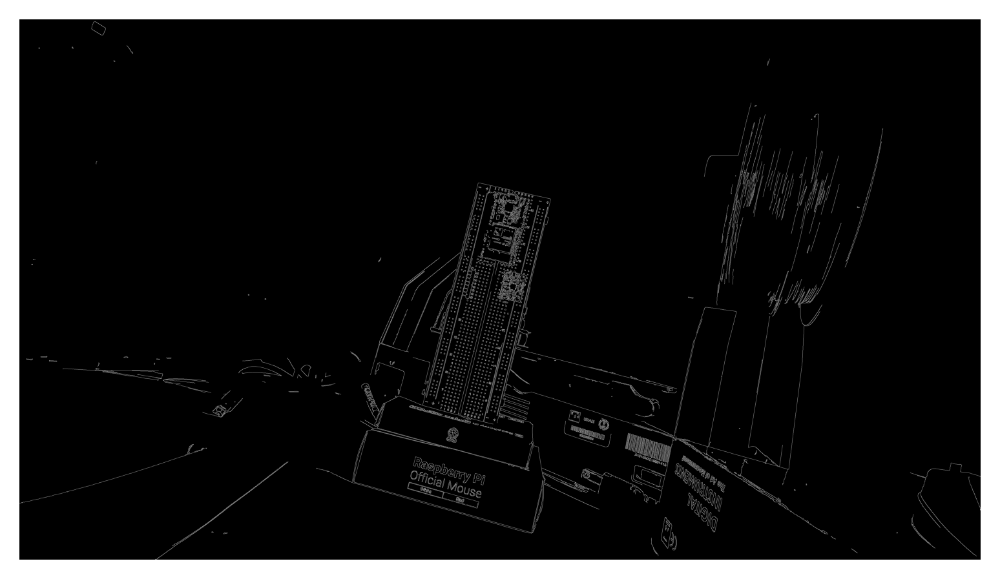

In [ ]:
#Vamos ahora a obtener contornos, vamos a utilizar sobel y el algoritmo de Canny
#Vamos a intentar con una imagen
test = cv.imread("new_images/NORMAL/airbuds/airbuds_1.jpg", cv.IMREAD_GRAYSCALE)
edges = cv.Canny(img, 100, 200)

plt.figure(dpi = 300)
plt.axis("off")
plt.imshow(edges, cmap="gray")

In [8]:
#Vamos a hacer la adquisición de imágenes y la gráfica en tiempo real
#Checamos las cámaras
list_cameras()

GENERAL WEBCAM: GENERAL WEBCAM (usb-0000:04:00.3-1.3):
	/dev/video5
	/dev/video6
	/dev/media2

HP Wide Vision FHD Camera: HP W (usb-0000:04:00.4-1.2):
	/dev/video0
	/dev/video1
	/dev/video2
	/dev/video3
	/dev/media0
	/dev/media1



In [10]:
#Vamos a tomar algunas otras fotos para mejorar el modelo
index = 5
save_folder = "captured_imgs"
save_pick(5, save_folder, index)

Press 'c' to capture an image, or 'q' to quit.
Saved: captured_imgs/img_1.jpg
Saved: captured_imgs/img_2.jpg
Saved: captured_imgs/img_3.jpg
Saved: captured_imgs/img_4.jpg
Saved: captured_imgs/img_5.jpg


In [11]:
#Vamos a pasar algunos códigos a tf_lite
pytorch_to_tflite_model("models/best_yolo_8/best_model_8.pt")

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.1+cu124 CPU (AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx)
YOLO11n summary (fused): 238 layers, 2,586,637 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from 'models/best_yolo_8/best_model_8.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 27, 8400) (5.2 MB)

TensorFlow SavedModel: starting export with tensorflow 2.18.0...

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.36...
ONNX: export success ✅ 2.5s, saved as 'models/best_yolo_8/best_model_8.onnx' (10.2 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...


I0000 00:00:1733820970.373850    5947 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
I0000 00:00:1733820970.374079    5947 single_machine.cc:361] Starting new session
W0000 00:00:1733820972.089818    5947 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1733820972.089885    5947 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1733820974.163018    5947 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
I0000 00:00:1733820974.163136    5947 single_machine.cc:361] Starting new session
W0000 00:00:1733820975.813261    5947 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1733820975.813312    5947 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.


TensorFlow SavedModel: export success ✅ 30.2s, saved as 'models/best_yolo_8/best_model_8_saved_model' (25.7 MB)

TensorFlow Lite: starting export with tensorflow 2.18.0...
TensorFlow Lite: export success ✅ 0.0s, saved as 'models/best_yolo_8/best_model_8_saved_model/best_model_8_float32.tflite' (10.2 MB)

Export complete (31.0s)
Results saved to /home/jesus/Documents/Servicio_Social/models/best_yolo_8
Predict:         yolo predict task=detect model=models/best_yolo_8/best_model_8_saved_model/best_model_8_float32.tflite imgsz=640  
Validate:        yolo val task=detect model=models/best_yolo_8/best_model_8_saved_model/best_model_8_float32.tflite imgsz=640 data=/content/drive/MyDrive/train_yolo_models/conditioned_db/training.yaml  
Visualize:       https://netron.app


In [8]:
list_cameras()

GENERAL WEBCAM: GENERAL WEBCAM (usb-0000:04:00.3-1.3):
	/dev/video5
	/dev/video6
	/dev/media2

HP Wide Vision FHD Camera: HP W (usb-0000:04:00.4-1.2):
	/dev/video0
	/dev/video1
	/dev/video2
	/dev/video3
	/dev/media0
	/dev/media1



In [ ]:
# Initialize variables
index = 0
model = YOLO("models/best_yolo_8/best_model_8_saved_model/best_model_8_float16.tflite")
cam = cv.VideoCapture(index)


if not cam.isOpened():
    print(f"Error: Unable to access camera at index {index}.")
    exit()

print("Press 'q' to quit.")

# Initialize data structures
objects_array = []
accuracies_array = []
std_array = []
x_array = []
cont = 0

while True:
    ret, frame = cam.read()
    if not ret or frame is None:
        print("Failed to grab frame. Exiting...")
        break

    # Pass frame to YOLO model
    results = model.predict(frame)

    # Annotate the image with predictions
    annotator = Annotator(frame)  # Use the valid frame
    for result in results:
        boxes = result.boxes
        for box in boxes:
            cont += 1
            x_array.append(cont)
            b = box.xyxy[0].numpy()  # Box coordinates [x_min, y_min, x_max, y_max]
            c = box.cls  # Class ID
            confidence = box.conf[0].numpy()  # Prediction confidence
            detected_object = model.names[int(c)]
            x_min, y_min, x_max, y_max = map(int, b)

            if frame[y_min:y_max, x_min:x_max].size > 0:  # Valid cropped image
                prediction_confidence = confidence
                objects_array.append(detected_object)
                accuracies_array.append(prediction_confidence)

                # Crop and calculate standard deviation
                trimmed_img = frame[y_min:y_max, x_min:x_max, :]
                std = np.std(trimmed_img, axis=(0, 1))
                std_array.append(std)

            # Annotate the image
            label = f"{model.names[int(c)]} ({confidence:.2f})"
            annotator.box_label(b, label)

    img = annotator.result()  # Get the annotated image
    if len(x_array) != len(accuracies_array):
        print(f"Mismatch in array sizes: x_array({len(x_array)}) vs accuracies_array({len(accuracies_array)})")
        min_len = min(len(x_array), len(accuracies_array))
        x_array = x_array[:min_len]
        accuracies_array = accuracies_array[:min_len]

    # Display the annotated image
    cv.imshow("Prediction", img)

    # Exit if 'q' is pressed
    if cv.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cam.release()
cv.destroyAllWindows()

# Finalize and save the 2D plot
plt.figure()
colors = ['green' if acc >= 0.9 else 'orange' if acc > 0.5 else 'red' for acc in accuracies_array]
plt.scatter(x_array, accuracies_array, c=colors, edgecolor='k')
plt.ylim(0, 1)
plt.title("Accuracy vs Object Detection Normalized")
plt.ylabel("Accuracy [0-1]")
plt.xlabel("Object Number")
plt.grid(True)
plt.savefig("accuracy_vs_detection_plot.png", bbox_inches='tight')
plt.close()

# Finalize and save the 3D plot
std_array = np.array(std_array)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    std_array[:, 0], std_array[:, 1], std_array[:, 2],
    c=colors, s=50, alpha=0.7, edgecolors='k'
)
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Accuracy Indicator")
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))
plt.savefig("rgb_std_scatter_plot.png", bbox_inches='tight')
plt.close()


WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Press 'q' to quit.
Loading models/best_yolo_8/best_model_8_saved_model/best_model_8_float16.tflite for TensorFlow Lite inference...

0: 640x640 (no detections), 343.9ms
Speed: 5.5ms preprocess, 343.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 268.7ms
Speed: 2.8ms preprocess, 268.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 227.9ms
Speed: 5.7ms preprocess, 227.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 212.3ms
Speed: 2.5ms preprocess, 212.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 210.5ms
Speed: 1.7ms preprocess, 210.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no de

In [11]:
# Initialize variables
index = 1
model = YOLO("models/best_yolo_8/best_model_8_saved_model/best_model_8_float16.tflite")
cam = cv.VideoCapture(index)

class_codes = {
    "glasses": "g1",
    "drive": "d1",
    "arduino": "a1",
    "flexometer": "f1",
    "charger": "c1",
    "battery": "b1",
    "nail clipper": "n1",
    "deodorant": "d2",
    "raspberry pi": "r1",
    "rubber band": "r2",
    "ic": "i1",
    "protoboard": "p1",
    "esp32": "e1",
    "usb": "u1",
    "pen": "p2",
    "sd_card": "s1",
    "lego_figurine": "l1",
    "earbuds": "e2",
    "ruler": "r3",
    "marker": "m1",
    "fork": "f2",
    "screwdriver": "s2",
    "wifi_antenna": "w1"
}

if not cam.isOpened():
    print(f"Error: Unable to access camera at index {index}.")
    exit()

print("Press 'q' to quit.")

# Initialize data structures
objects_array = []
accuracies_array = []
std_array = []
x_array = []
cont = 0

while True:
    ret, frame = cam.read()
    if not ret or frame is None:
        print("Failed to grab frame. Exiting...")
        break

    # Pass frame to YOLO model
    results = model.predict(frame)

    # Annotate the image with predictions
    annotator = Annotator(frame)  # Use the valid frame
    for result in results:
        boxes = result.boxes
        for box in boxes:
            cont += 1
            b = box.xyxy[0].numpy()  # Box coordinates [x_min, y_min, x_max, y_max]
            c = box.cls  # Class ID
            confidence = box.conf[0].numpy()  # Prediction confidence
            detected_object = model.names[int(c)]
            x_min, y_min, x_max, y_max = map(int, b)

            # Add object detection details
            prediction_confidence = confidence
            objects_array.append(detected_object)
            accuracies_array.append(prediction_confidence)
            x_array.append(cont)

            # Get the class code
            class_code = class_codes.get(detected_object, "unknown")

            # Crop the image for standard deviation calculation
            if frame[y_min:y_max, x_min:x_max].size > 0:  # Valid cropped image
                trimmed_img = frame[y_min:y_max, x_min:x_max, :]
                std = np.std(trimmed_img, axis=(0, 1))
                std_array.append(std)

            # Annotate the image
            label = f"{model.names[int(c)]} ({confidence:.2f})"
            annotator.box_label(b, label)

    img = annotator.result()  # Get the annotated image
    if len(x_array) != len(accuracies_array):
        print(f"Mismatch in array sizes: x_array({len(x_array)}) vs accuracies_array({len(accuracies_array)})")
        min_len = min(len(x_array), len(accuracies_array))
        x_array = x_array[:min_len]
        accuracies_array = accuracies_array[:min_len]

    # Display the annotated image
    cv.imshow("Prediction", img)

    # Exit if 'q' is pressed
    if cv.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cam.release()
cv.destroyAllWindows()

# Finalize and save the 2D plot
plt.figure()
colors = ['green' if acc >= 0.9 else 'orange' if acc > 0.5 else 'red' for acc in accuracies_array]
plt.scatter(x_array, accuracies_array, c=colors, edgecolor='k')

# Annotate with class codes
for i, obj in enumerate(objects_array):
    class_code = class_codes.get(obj, "unknown")
    plt.text(x_array[i], accuracies_array[i], class_code, fontsize=8, ha='right', color='blue')

plt.ylim(0, 1)
plt.title("Accuracy vs Object Detection Normalized")
plt.ylabel("Accuracy [0-1]")
plt.xlabel("Object Number")
plt.grid(True)
plt.savefig("accuracy_vs_detection_plot.png", bbox_inches='tight')
plt.close()

'''
# 3D Scatter Plot for Standard Deviation
std_array_np = np.array(std_array)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

colors = ['green' if acc >= 0.9 else 'orange' if acc > 0.5 else 'red' for acc in accuracies_array]
scatter = ax.scatter(
    std_array_np[:, 0], std_array_np[:, 1], std_array_np[:, 2],
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Annotate with class codes
for i, obj in enumerate(objects_array):
    class_code = class_codes.get(obj, "unknown")
    ax.text(
        std_array_np[i, 0], std_array_np[i, 1], std_array_np[i, 2],
        class_code, color='blue', fontsize=8
    )

ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Accuracy Indicator")

# Add a legend for accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))
plt.savefig("std_rgb_3d_scatter_plot.png", bbox_inches='tight')
plt.close()
'''
# Finalize and save the 3D plot
std_array = np.array(std_array)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    std_array[:, 0], std_array[:, 1], std_array[:, 2],
    c=colors, s=50, alpha=0.7, edgecolors='k'
)
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Accuracy Indicator")
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))
plt.savefig("rgb_std_scatter_plot.png", bbox_inches='tight')
plt.close()

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Press 'q' to quit.
Loading models/best_yolo_8/best_model_8_saved_model/best_model_8_float16.tflite for TensorFlow Lite inference...

0: 640x640 (no detections), 263.6ms
Speed: 8.1ms preprocess, 263.6ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 263.7ms
Speed: 5.3ms preprocess, 263.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 256.8ms
Speed: 4.5ms preprocess, 256.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 276.3ms
Speed: 2.5ms preprocess, 276.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 261.0ms
Speed: 2.2ms preprocess, 261.0ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no de

In [14]:
#Ahora vamos a ver si podemos hacerlo que plotee al mismo tiempo que realiza la detección
# Initialize variables
index = 5
model = YOLO("models/best_yolo_8/best_model_8_saved_model/best_model_8_float16.tflite")
#model = YOLO("models/best_yolo_8/best_model_8.onnx")
cam = cv.VideoCapture(index)

class_codes = {
    "glasses": "g1",
    "drive": "d1",
    "arduino": "a1",
    "flexometer": "f1",
    "charger": "c1",
    "battery": "b1",
    "nail clipper": "n1",
    "deodorant": "d2",
    "raspberry pi": "r1",
    "rubber band": "r2",
    "ic": "i1",
    "protoboard": "p1",
    "esp32": "e1",
    "usb": "u1",
    "pen": "p2",
    "sd_card": "s1",
    "lego_figurine": "l1",
    "earbuds": "e2",
    "ruler": "r3",
    "marker": "m1",
    "fork": "f2",
    "screwdriver": "s2",
    "wifi_antenna": "w1"
}

if not cam.isOpened():
    print(f"Error: Unable to access camera at index {index}.")
    exit()

print("Press 'q' to quit.")

# Initialize data structures
objects_array = []
accuracies_array = []
std_array = []
x_array = []
cont = 0

while True:
    ret, frame = cam.read()
    if not ret or frame is None:
        print("Failed to grab frame. Exiting...")
        break

    # Pass frame to YOLO model
    results = model.predict(frame)

    # Annotate the image with predictions
    annotator = Annotator(frame)  # Use the valid frame
    for result in results:
        boxes = result.boxes
        for box in boxes:
            cont += 1
            b = box.xyxy[0].numpy()  # Box coordinates [x_min, y_min, x_max, y_max]
            c = box.cls  # Class ID
            confidence = box.conf[0].numpy()  # Prediction confidence
            detected_object = model.names[int(c)]
            x_min, y_min, x_max, y_max = map(int, b)

            # Add object detection details
            prediction_confidence = confidence
            objects_array.append(detected_object)
            accuracies_array.append(prediction_confidence)
            x_array.append(cont)

            # Get the class code
            class_code = class_codes.get(detected_object, "unknown")

            # Crop the image for standard deviation calculation
            if frame[y_min:y_max, x_min:x_max].size > 0:  # Valid cropped image
                trimmed_img = frame[y_min:y_max, x_min:x_max, :]
                std = np.std(trimmed_img, axis=(0, 1))
                std_array.append(std)

            # Annotate the image
            label = f"{model.names[int(c)]} ({confidence:.2f})"
            annotator.box_label(b, label)

    img = annotator.result()  # Get the annotated image
    if len(x_array) != len(accuracies_array):
        print(f"Mismatch in array sizes: x_array({len(x_array)}) vs accuracies_array({len(accuracies_array)})")
        min_len = min(len(x_array), len(accuracies_array))
        x_array = x_array[:min_len]
        accuracies_array = accuracies_array[:min_len]

    # Display the annotated image
    cv.imshow("Prediction", img)

    # Exit if 'q' is pressed
    if cv.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cam.release()
cv.destroyAllWindows()

# Finalize and save the 2D plot
plt.figure()
colors = ['green' if acc >= 0.9 else 'orange' if acc > 0.5 else 'red' for acc in accuracies_array]
plt.scatter(x_array, accuracies_array, c=colors, edgecolor='k')

# Annotate with class codes
for i, obj in enumerate(objects_array):
    class_code = class_codes.get(obj, "unknown")
    plt.text(x_array[i], accuracies_array[i], class_code, fontsize=8, ha='right', color='blue')

plt.ylim(0, 1)
plt.title("Accuracy vs Object Detection Normalized")
plt.ylabel("Accuracy [0-1]")
plt.xlabel("Object Number")
plt.grid(True)
plt.savefig("accuracy_vs_detection_plot.png", bbox_inches='tight')
plt.close()

'''
# 3D Scatter Plot for Standard Deviation
std_array_np = np.array(std_array)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

colors = ['green' if acc >= 0.9 else 'orange' if acc > 0.5 else 'red' for acc in accuracies_array]
scatter = ax.scatter(
    std_array_np[:, 0], std_array_np[:, 1], std_array_np[:, 2],
    c=colors, s=50, alpha=0.7, edgecolors='k'
)

# Annotate with class codes
for i, obj in enumerate(objects_array):
    class_code = class_codes.get(obj, "unknown")
    ax.text(
        std_array_np[i, 0], std_array_np[i, 1], std_array_np[i, 2],
        class_code, color='blue', fontsize=8
    )

ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Accuracy Indicator")

# Add a legend for accuracy levels
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))
plt.savefig("std_rgb_3d_scatter_plot.png", bbox_inches='tight')
plt.close()
'''
# Finalize and save the 3D plot
std_array = np.array(std_array)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    std_array[:, 0], std_array[:, 1], std_array[:, 2],
    c=colors, s=50, alpha=0.7, edgecolors='k'
)
ax.set_xlabel("STD - Red Channel")
ax.set_ylabel("STD - Green Channel")
ax.set_zlabel("STD - Blue Channel")
ax.set_title("3D Scatter Plot of RGB STD with Accuracy Indicator")
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Acc <= 0.5'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='0.5 < Acc < 0.9'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Acc >= 0.9')
]
ax.legend(handles=handles, title="Accuracy Levels", loc='upper left', bbox_to_anchor=(1, 0.8))
plt.savefig("rgb_std_scatter_plot.png", bbox_inches='tight')
plt.close()

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Press 'q' to quit.


Loading models/best_yolo_8/best_model_8_saved_model/best_model_8_float16.tflite for TensorFlow Lite inference...

0: 640x640 1 pen, 399.9ms
Speed: 13.1ms preprocess, 399.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 pen, 400.9ms
Speed: 4.6ms preprocess, 400.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 476.8ms
Speed: 9.1ms preprocess, 476.8ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 pen, 390.3ms
Speed: 6.8ms preprocess, 390.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 394.5ms
Speed: 5.3ms preprocess, 394.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 388.1ms
Speed: 9.2ms preprocess, 388.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 protoboard, 367.7ms
Speed: 5.1ms preprocess, 367.7ms inference, 2.2ms postprocess per image at 

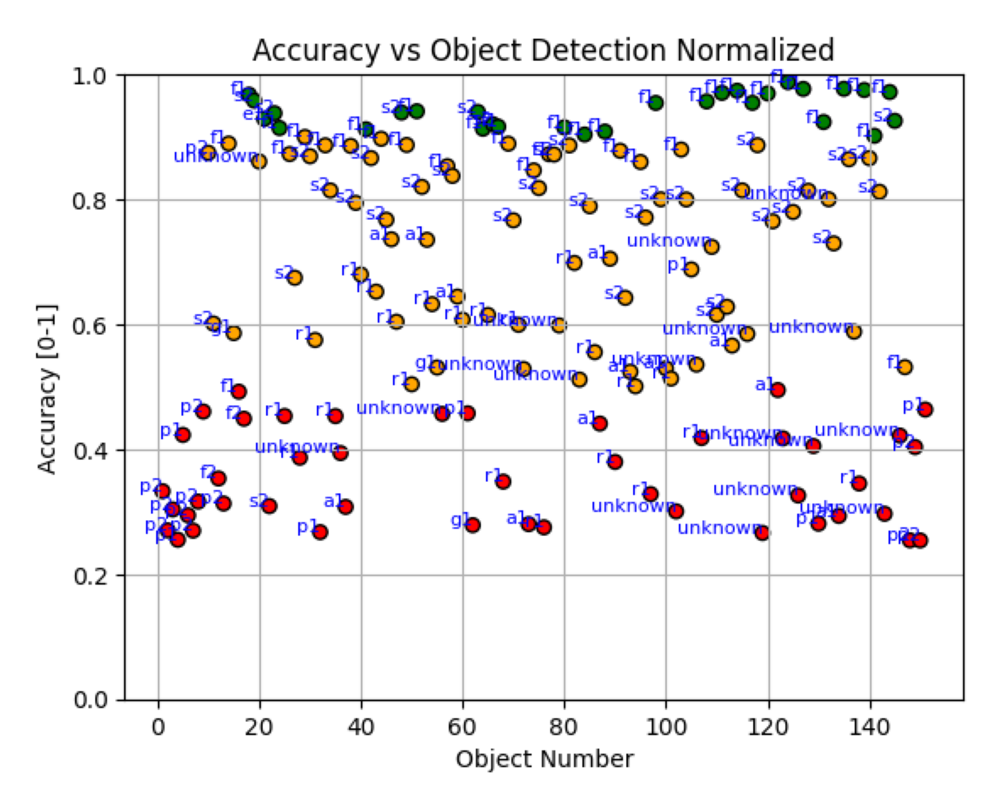

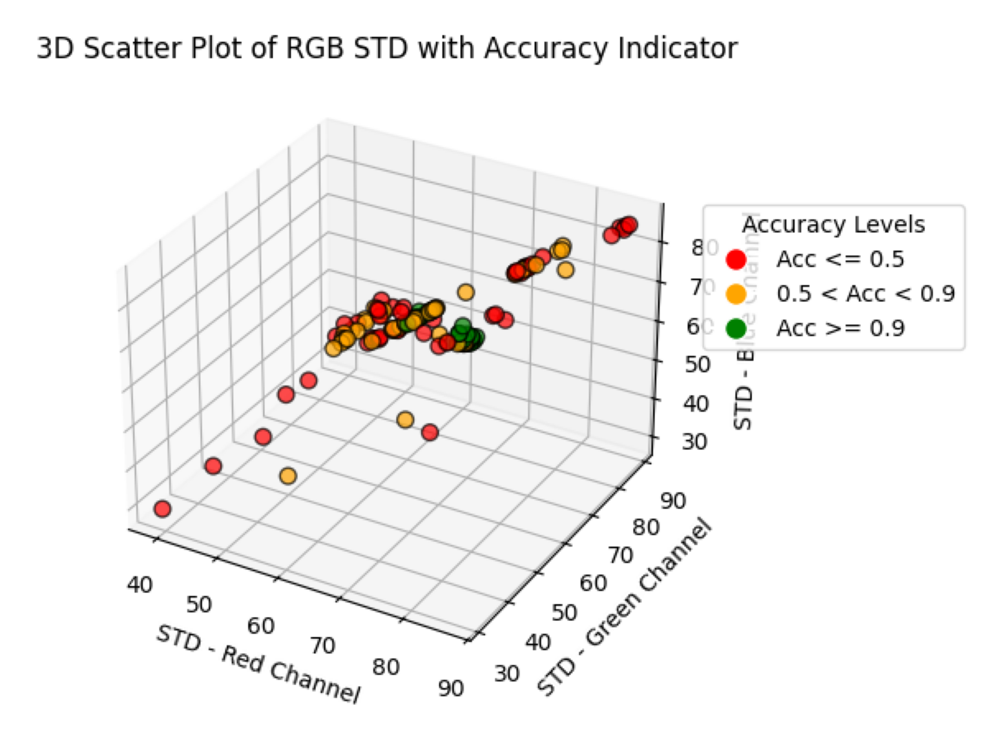

In [15]:
#Vemos el plot en 2D
img1 = np.array(Image.open("accuracy_vs_detection_plot.png"))
plt.figure(dpi=300)
plt.axis("off")
plt.imshow(img1)

#Vemos primero el plot 3D
img2 = np.array(Image.open("rgb_std_scatter_plot.png"))
plt.figure(dpi=300)
plt.axis("off")
plt.imshow(img2)